# Camera Unit Alignement on Spectrogrpah Module (n2)
see PFS SpS Spectral channel alignment procedure iss2.0

"PFS_SpS_LAM_1044_SpectralChannelAlign_Proc_iss2-0_signed.pdf"

Pipeline manual

https://github.com/Subaru-PFS/drp_doc/blob/master/pipelineUser/commonArguments.rst#--configfile-and--c

**2026.06.07 HST**

visit=144510, halogen: 144511 : First check of the camera aligment.    
---> alignment looks OK


## import

In [1]:
%load_ext autoreload
 
%autoreload 2

In [9]:
from datetime import datetime
import os
import pandas as pd
import math
import numpy as np

In [3]:
import matplotlib.pyplot as plt

#plt.rcParams["figure.facecolor"] = "white" 

In [4]:
%matplotlib ipympl

### DRP modules

In [27]:
from lsst.daf.butler import Butler
from pfs.drp.stella import DetectorMap
from pfs.drp.stella.utils import showDetectorMap
from pfs.datamodel.pfsConfig import *

In [7]:
afwDisplay.setDefaultBackend("matplotlib")

### LAM modules

In [8]:
from pfs.lam.opdb import getVisitRange
from pfs.lam.imageAnalysis import estimateCOM, fitparabola
from pfs.lam.linePeaksList import filterPeakList
from pfs.lam.smAlign import *

In [9]:
datetime.now().strftime("%Y-%m-%dT%Hh%M")

'2024-08-21T15h16'

In [7]:
#define where plots will be saved
#imgPath = "/work/fmadec/analysis/sm1/"
imgPath = "/work/moritani/spsAIT/202606/alignment_N2"

In [10]:
if os.path.exists(imgPath) is False:
    print(f"create foler {imgPath}")
    os.makedirs(imgPath, exist_ok=True)

create foler /work/moritani/spsAIT/202606/alignment_N2


In [12]:
savePlot = False

# Butler and Data
Define: ExpId/visitId arm and specId

In [11]:
summit = False
if summit:
    base, rerun = "/data/drp/repo/", "drpActor/CALIB"
    #calibRoot = "/data/drp/repo/CALIB/"
else:
    datastore = '/work/datastore'
    collections = ['drpActor/reductions', 'PFS/defaults']

butler = Butler(datastore, collections=collections, instrument='PFS')

In [36]:
# N2 Camera
site = "Subaru"
specId = 2
arm = "n"
cam = f"{arm}{specId}"

In [ ]:
# This cell is used to analyse the LAM data
# expId = 3396 
visitStart, visitEnd = getVisitRange(expId)
print(visitStart, visitEnd)

In [15]:
LAMlines = pd.read_csv("/home/fmadec/SM2_LAM_nirJan2023_peakList.csv")

In [16]:
LAMlines.lamp.unique()

array(['Kr', 'Ar', 'Xe'], dtype=object)

In [57]:
# IIS to check alignment (Kr)
visit = 113419

**Run bootstrap**

IIS --- Kr: 144510, halogen: 144511

pipetask --long-log --log-level pfs=INFO run -j 4 -b /work/datastore --instrument lsst.obs.pfs.PrimeFocusSpectrograph -i PFS/defaults -o u/moritani/test2026006/n2 -p '$DRP_STELLA_DIR/pipelines/bootstrap.yaml' -d "visit IN (144510,144511) AND arm = 'n' AND spectrograph = 2 " -c isr:h4.quickCDS=True -c isr:h4.doLinearize=False -c isr:doCrosstalk=False --no-versions -c bootstrap:profiles.findThreshold=800 -c bootstrap:profiles.associationDepth=20 -c bootstrap:profiles.convolveGrowMask=2 -c bootstrap:profiles.pruneMinFrac=0.6 -c bootstrap:findLines.doSubtractContinuum=False -c bootstrap:spectralOffset=0 -c bootstrap:spatialOffset=0 -c 'bootstrap:targetType=[ENGINEERING]'


```
INFO 2026-06-08T17:55:02.385-10:00 pfs.bootstrap.readLineList (bootstrap:{instrument: 'PFS', arm: 'n', spectrograph: 2})(readLineList.py:187) - Filtered line lists ['KrI'] by {'Kr_eng'}, keeping species {'KrI'}.    
INFO 2026-06-08T17:55:02.415-10:00 pfs.bootstrap (bootstrap:{instrument: 'PFS', arm: 'n', spectrograph: 2})(bootstrap.py:464) - Matched 123 lin s
INFO 2026-06-08T17:55:02.416-10:00 pfs.bootstrap (bootstrap:{instrument: 'PFS', arm: 'n', spectrograph: 2})(bootstrap.py:555) - Median difference from detectorMap: -4.282070,6.116641 pi  ls
INFO 2026-06-08T17:55:02.422-10:00 pfs.bootstrap (bootstrap:{instrument: 'PFS', arm: 'n', spectrograph: 2})(bootstrap.py:561) - Fit 105/123 points, rms: x=0.078041 y=1.499101 total=1.046929xelsps
e```


pipetask --long-log --log-level pfs=INFO run -j 4 -b /work/datastore --instrument lsst.obs.pfs.PrimeFocusSpectrograph -i PFS/defaults -o u/moritani/test2026006/n2 -p '$DRP_STELLA_DIR/pipelines/bootstrap.yaml' -d "visit IN (144510,144511) AND arm = 'n' AND spectrograph = 2 " -c isr:h4.quickCDS=True -c isr:h4.doLinearize=False -c isr:doCrosstalk=False --no-versions -c bootstrap:profiles.findThreshold=800 -c bootstrap:profiles.associationDepth=20 -c bootstrap:profiles.convolveGrowMask=2 -c bootstrap:profiles.pruneMinFrac=0.6 -c 
bootstrap:findLines.doSubtractContinuum=False -c bootstrap:spectralOffset=10 -c bootstrap:spatialOffset=0 -c 'bootstrap:targetType=[ENGINEERING]'
l
```
INFO 2026-06-08T19:19:45.421-10:00 pfs.bootstrap (bootstrap:{instrument: 'PFS', arm: 'n', spectrograph: 2})(bootstrap.py:464) - Matched 124 line   
INFO 2026-06-08T19:19:45.422-10:00 pfs.bootstrap (bootstrap:{instrument: 'PFS', arm: 'n', spectrograph: 2})(bootstrap.py:555) - Median difference from detectorMap: -4.293048,-2.717343 p    s
INFO 2026-06-08T19:19:45.429-10:00 pfs.bootstrap (bootstrap:{instrument: 'PFS', arm: 'n', spectrograph: 2})(bootstrap.py:561) - Fit 107/124 points, rms: x=0.075059 y=0.473424 total=0.338750 
`lsls
```

Check detectorMap on calExp image

In [58]:
dataId = dict(visit=visit, arm=arm, spectrograph=specId)
exp = butler.get("calexp", dataId)

In [59]:
# detectormap
#detMap = butler.get('detectorMap', dataId)
# or 
detMap = DetectorMap.readFits(f"/work/drp/rerun/moritani/sm1-202408/bootstrap/DETECTORMAP/pfsDetectorMap-{visit:06d}-{cam}.fits")

simMap = DetectorMap.readFits("/work/drp/CALIB/DETECTORMAP/pfsDetectorMap-104144-n1.fits")    

In [60]:
#rbutler = dafPersist.Butler(f"{dataDir}")
butler.getKeys('raw')
lamps = butler.queryMetadata('raw', ['lamps'], visit=visit, arm=arm) 
print(lamps)

['Kr_eng']


In [38]:
dir(detMap)

['__class__',
 '__contains__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '_subclasses',
 'applySlitOffset',
 'base',
 'bbox',
 'clone',
 'display',
 'distortion',
 'fiberId',
 'findFiberId',
 'findPoint',
 'findWavelength',
 'fromBytes',
 'fromDatamodel',
 'fromFits',
 'getBBox',
 'getBase',
 'getDispersion',
 'getDispersionAtCenter',
 'getDistortion',
 'getFiberId',
 'getMetadata',
 'getNumFibers',
 'getSlope',
 'getSpatialOffset',
 'getSpatialOffsets',
 'getSpectralOffset',
 'getSpectralOffsets',
 'getVisitInfo',
 'getWavelength',
 'getXCenter',
 'metadata',
 'method',
 'readFits',
 'register',
 'setSlitOffsets',
 'setVisitInfo',
 'toBytes',
 'toDatamodel',


In [61]:
pfsConfig = butler.get("pfsConfig", dataId).select(spectrograph=specId)
# DCB
#pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.DCB]
# IIS
pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.ENGINEERING]
fiberIds = pfsConfig.fiberId[pfsConfig.spectrograph == specId]

/work/moritani/codes/drp_stella/python/pfs/drp/stella/utils/display.py:244: UserWarning: addPfsCursor: Using an old version of display_matplotlib. Ideally need one that has the method DisplayImpl.set_format_coord. Using workaround.
  warnings.warn("addPfsCursor: Using an old version of display_matplotlib. "


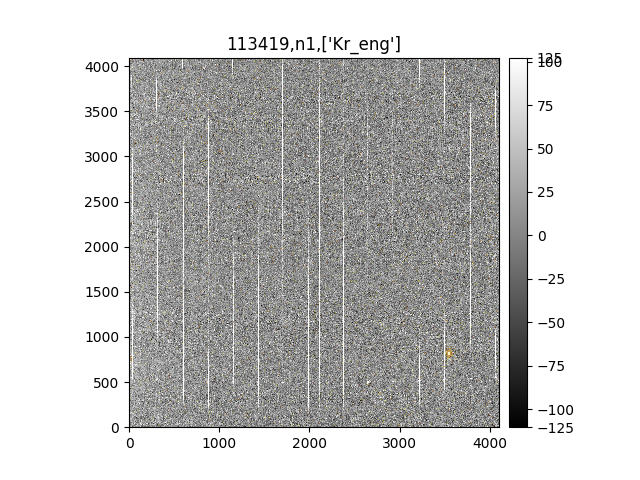

In [62]:
fig = 1; plt.close(fig); fig = plt.figure(fig)

display = afwDisplay.Display(fig)
display.scale("linear", min="zscale")
display.mtv(exp, f'{visit},{cam},{lamps}')
addPfsCursor(display, detectorMap=detMap)

In [23]:
from pfs.drp.stella.referenceLine import ReferenceLineStatus
status = ReferenceLineStatus.LAM_FOCUS | ReferenceLineStatus.LAM_IMAGEQUALITY  # Selecting both kinds of LAM flags
#select = (lines.status & status) != 0  # Bit is set for status flags

In [24]:
from pfs.drp.stella.readLineList import ReadLineListTask
lines = ReadLineListTask().run(detectorMap=detMap, metadata=exp.getMetadata())
#select = (lines.status & status) != 0  # Bit is set for status flags

In [35]:
lines.wavelength

array([ 929.042  ,  930.195  ,  932.859  ,  934.05   ,  935.469  ,
        935.48   ,  936.467  ,  945.347  ,  953.49   ,  954.351  ,
        960.98   ,  961.827  ,  967.168  ,  968.492  ,  969.049  ,
        970.688  ,  971.751  ,  972.545  ,  973.018  ,  974.578  ,
        975.44352,  977.137  ,  979.758  ,  981.296  ,  984.103  ,
        985.894  ,  986.565  ,  989.979  ,  991.909  ,  992.032  ,
        999.2    , 1004.14   , 1005.762  , 1006.872  , 1008.042  ,
       1012.373  , 1015.046  , 1027.64   , 1029.975  , 1032.571  ,
       1036.321  , 1037.728  , 1046.143  , 1048.916  , 1055.253  ,
       1057.84   , 1059.594  , 1061.137  , 1062.961  , 1064.764  ,
       1070.226  , 1073.237  , 1080.43   , 1087.788  , 1119.017  ,
       1121.765  , 1126.0787 , 1126.224  , 1126.579  , 1128.9672 ,
       1130.69   , 1131.92   , 1133.161  , 1133.654  , 1146.0614 ,
       1161.48   , 1165.9    , 1179.564  , 1182.26136, 1197.0457 ,
       1199.928  , 1200.0385 , 1208.052  , 1208.2156 , 1212.11

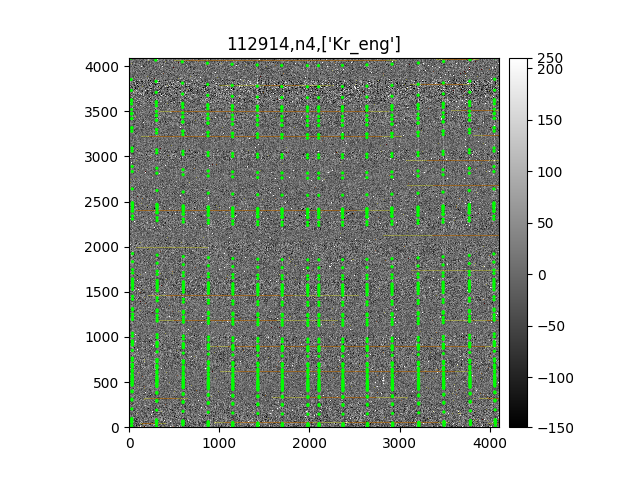

In [36]:
## map all lines
detMap.display(display, fiberId=pfsConfig.fiberId, wavelengths=lines.wavelength, plotTraces=False);
#detMap.display(display, fiberId=pfsConfig.fiberId, plotTraces=False);

In [25]:
lamps = ["Kr"]
select = filterPeakList(LAMlines, arm, lamps)
select = select.wavelength.sort_values().unique()
select

array([ 970.688  ,  985.894  , 1036.321  , 1087.788  , 1119.017  ,
       1146.0614 , 1179.564  , 1182.26136, 1220.78754])

In [174]:
select = LAMlines.wavelength.sort_values().unique()
select

array([ 966.0435 ,  970.688  ,  978.7186 ,  980.2384 ,  985.894  ,
        992.5919 , 1036.321  , 1087.788  , 1119.017  , 1146.0614 ,
       1167.1904 , 1179.564  , 1182.26136, 1220.78754, 1240.6221 ,
       1270.5756 ])

In [ ]:
len(select)

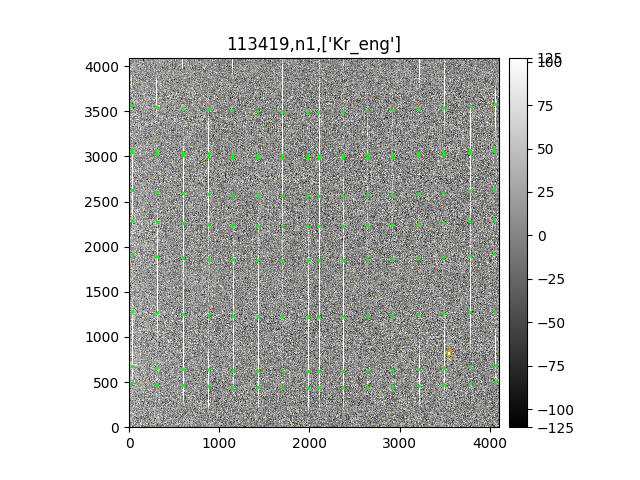

In [63]:
## map LAM-selected line
detMap.display(display, fiberId=pfsConfig.fiberId, wavelengths=select, plotTraces=False);
#detMap.display(display, fiberId=pfsConfig.fiberId, plotTraces=False);

In [ ]:
fig = 1; plt.close(fig); fig = plt.figure(fig)

display = afwDisplay.Display(fig)
display.scale("linear", min="zscale")
display.mtv(exp, f'{visit},{cam},{lamps}')
#addPfsCursor(display, detectorMap=simMap)

In [ ]:
## map simlatedMap
simMap.display(display, fiberId=pfsConfig.fiberId, wavelengths=select, plotTraces=False);
#detMap.display(display, fiberId=pfsConfig.fiberId, plotTraces=False);

In [35]:
(lines.status & status)

array([   0, 6144,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0], dtype=int32)

In [36]:
970+(1250-970)/2

1110.0

In [118]:
visit, np.median(detMap.getSpatialOffsets()), np.median(detMap.getSpectralOffsets())

(101782, 4.0, -29.995134085619615)

*Note: If the detectormap is not newly created (nor specified), the offset is the same*

# Camera Unit ROLL alignment

Section 3.4. By looking the spots on a given line, measure rotation.

Goal is that difference between the extreme fiber is ***< 1pix (~50arcsec)***

For estimated shim value, + and - means "removing" and "adding2 the shim, respectively.

## Measure shift

In [111]:
RfrontBell=372.5 # radias of the front bell in mm

In [119]:
# Define centre wavelength to the corresponding arm
switchWave = {
    "r":[795.0362,826.6794],
    "b":0,
    #"n":[1087.788  , 1119.017]  # Ar?
    #"n":[1085.  , 1119.017]
    "n":[1087.788  , 1146.06]  # Kr
    }
midWaves  = switchWave.get(arm,"Invalid input" )

In [ ]:
print(midWaves)

In [236]:
# Ne, initial state
# IIS Kr, initial condition
#visit=112917
# IIS to check alignment (Kr): after CU Horizontal tilt correction  anf screwed
visit = 112934

/work/moritani/codes/drp_stella/python/pfs/drp/stella/utils/display.py:244: UserWarning: addPfsCursor: Using an old version of display_matplotlib. Ideally need one that has the method DisplayImpl.set_format_coord. Using workaround.
  warnings.warn("addPfsCursor: Using an old version of display_matplotlib. "


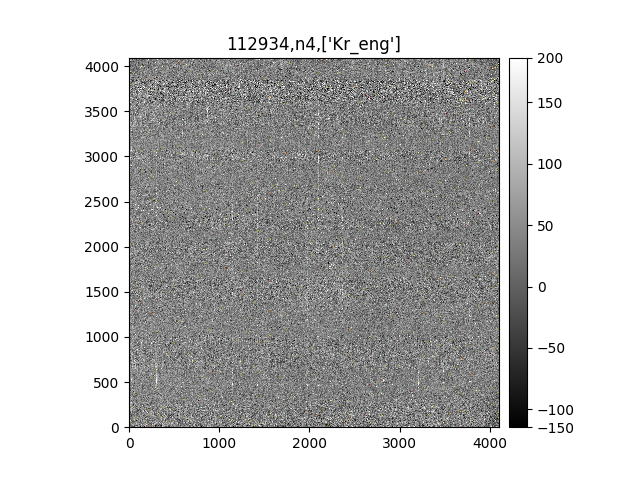

In [237]:
fig = 2; plt.close(fig); fig = plt.figure(fig)

display = afwDisplay.Display(fig)
display.scale("linear", min="zscale")
display.mtv(exp, f'{visit},{cam},{lamps}')
addPfsCursor(display, detectorMap=detMap)

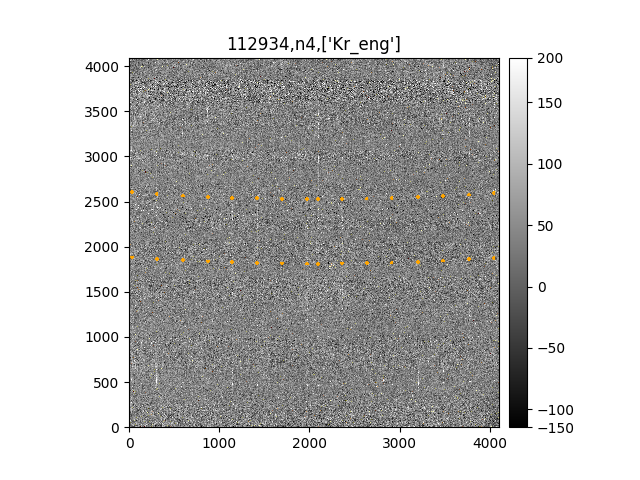

In [238]:
# overlay selected wave for each fiber used
ls = "+"
alpha = 0.5
color= "r"

with display.Buffering():
    for fiber in pfsConfig.fiberId:
        for midWave in midWaves:
            pt = detMap.findPoint(fiber, midWave)
            display.dot("+",pt.getX(), pt.getY(), size=10, ctype="orange")

In [239]:
# Retrieve position of this wave for each fiber 
# for calculation
data = []
for fiber in pfsConfig.fiberId:
    for midWave in midWaves:
        pt = detMap.findPoint(fiber, midWave)
        data.append({"fiberId": fiber, "wavelength": midWave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber - (specId-1)*651  })

In [240]:
df = pd.DataFrame.from_dict(data)

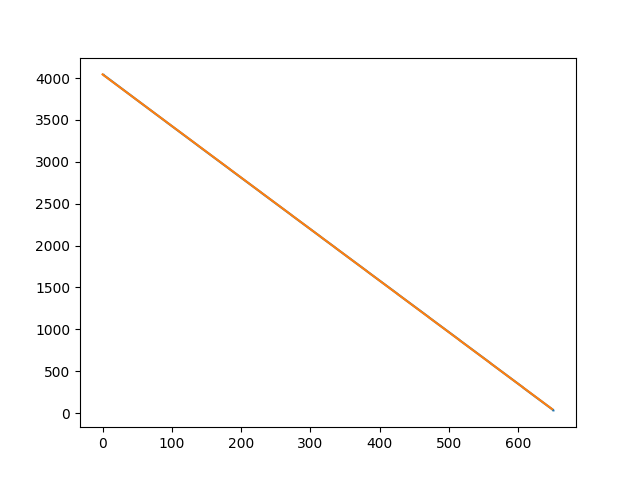

In [241]:
# This is to show both fiber and pixel on plot
# need a function to swith to fiber from px and inverse
# this is linear function
coef = np.polyfit(df.x, df.fiber, 1)

px2fiber = np.poly1d(coef)

coef = np.polyfit(df.fiber, df.x, 1)

fiber2px = np.poly1d(coef)

plt.figure()
plt.plot(df.fiber, df.x)
plt.plot(np.arange(0,650),fiber2px(np.arange(0,650)))

In [296]:
# This shift is calculated using position of a center wavelength for the 2 extreme fibers (2 and 650)
cu_roll_shift = df[df.fiber == 1].y.values - df[df.fiber == 651].y.values
distance =  df[df.fiber == 1].x.values - df[df.fiber == 651].x.values

# Calculation of shift
print(distance)
roll_angle = math.atan(np.mean(cu_roll_shift/distance))
cu_roll_shift = cu_roll_shift.mean()
print(roll_angle)

roll_shim = RfrontBell * math.tan(roll_angle)
annot = "roll_shift %.1f px\n"%cu_roll_shift
annot += "roll_angle %.1f arsec \n"%(math.degrees(roll_angle)*3600)
annot += "roll_shim %.2f mm (here, minus means add shim)\n"%roll_shim
print(annot)

[4005.92859366 4008.14476153]
-0.0012356161023679296
roll_shift -5.0 px
roll_angle -254.9 arsec 
roll_shim -0.46 mm (here, minus means add shim)



In [ ]:
annot, roll_shim, roll_angle = getRollCu(df, doPrint=True)

In [145]:
np.rad2deg(roll_angle)*3600.

-455.7200608817155

In [141]:
df

,fiberId,wavelength,x,y,fiber
0,1954,1087.788,4044.463098,1840.782777,1
1,1954,1146.060,4044.249823,2559.340057,1
2,1998,1087.788,3771.677341,1824.473187,45
3,1998,1146.060,3771.198677,2541.783773,45
4,2045,1087.788,3481.257203,1809.769080,92
5,2045,1146.060,3480.571385,2526.052367,92
6,2090,1087.788,3203.830004,1798.313285,137
7,2090,1146.060,3202.996730,2513.858364,137
8,2137,1087.788,2914.507028,1789.088297,184
9,2137,1146.060,2913.556692,2504.077764,184


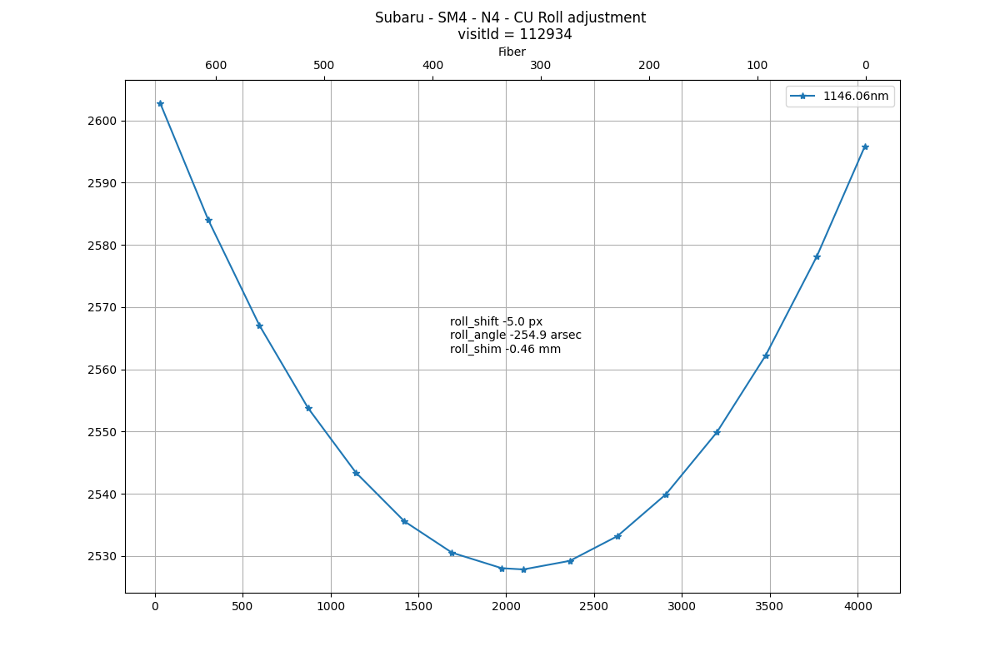

In [246]:
fig, ax = plt.subplots(figsize=(12,8))
plt.grid()
plt.title(f"{site} - SM{specId} - {cam.upper()} - CU Roll adjustment \n visitId = {visit}")
ax.plot("x", "y", "*-", label=f"{midWave}nm", data=df[df.wavelength == midWave])

secax = ax.secondary_xaxis(1, functions=(px2fiber, fiber2px))
secax.set_xlabel('Fiber')

#ax = df.groupby("wavelength")[["x","y"]].plot(kind="scatter")
#ax.plot("x", "y", data=df.groupby("wavelength")) #  "*-", label=f"{midWave}nm")
ax.annotate(annot,  xy=(.45,.45),xycoords="figure fraction")

ax.legend(loc="best")

### plot 

In [247]:
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CURoll_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)

/work/moritani/spsAIT/202407/alignment_N4/Subaru_SM4_N4_CURoll_before_112934__2024-07-17T23h38.png


[]
nan
roll_shift nan px
roll_angle nan arsec 
roll_shim nan mm




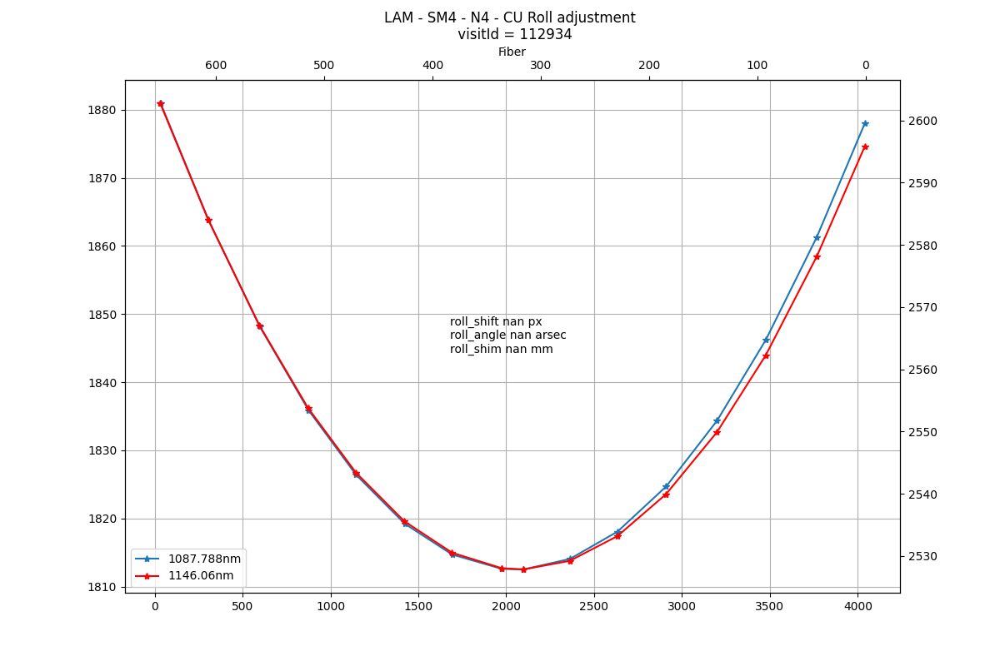

In [248]:
savePlot=True
plot_CU_roll(df, dataId, midWaves, doPrint=True, fname=fname, doSavePlot=savePlot, px2fiber=px2fiber, fiber2px=fiber2px )

## Do the Cameara Unit Roll adjustment

### found peak centration after alignment
the peak (fiver, wave) position will move with the aligmnent, but not so far from the original position
so we try to find the peak position in a roi (region of interest) around the original position

roi_size can be adjusted, value by defaut is 15 px

In [ ]:
roi_size = 25

### Define VisitId after CU Roll alignment

In [ ]:
# Image after alignment
expId = 0
visit = 49518dispCURoll2.scale("linear", min="zscale")


In [ ]:
base, rerun = "/data/drp/sps", "ginga/detrend"

dataDir = os.path.join(base, "rerun", rerun) if rerun else base
calibRoot = "/data/drp/sps/CALIB/"

butler = dafPersist.Butler(dataDir) #, calibRoot=calibRoot)

In [ ]:
dataId = dict(visit=visit, arm=arm, spectrograph=specId)
exp = butler.get("calexp", dataId)

In [ ]:
fig = 2; plt.close(fig); fig = plt.figure(fig)

dispCURoll2 = afwDisplay.Display(fig)
dispCURoll2.scale("linear", min="zscale")

dispCURoll2.mtv(exp)

In [ ]:
dispCURoll2.erase

In [ ]:
afterData = []
for name, group in df.groupby(["fiber", "wavelength"]):
    [fiberId] = group["fiberId"].values
    [wave] = group["wavelength"].values
    [fiber] = group["fiber"].values
    [x0] =  group["x"].values
    [y0] =  group["y"].values
    x, y = estimateCOM(exp.image.array, x0, y0, roi_size=roi_size, doBck=True)
    afterData.append({"fiberId": fiberId, "wavelength": wave, "x": x, "y": y, "fiber": fiber })
    print(fiber, wave, x-x0, y-y0)

In [ ]:
# overlay selected wave for each fiber used
ls = "+"
alpha = 0.5
color= "r"

with dispCURoll2.Buffering():
    for origi, val in zip(data, afterData):
        dispCURoll2.dot("o",origi['x'], origi['y'], size=roi_size, ctype="red")
        dispCURoll2.dot("x",val['x'], val['y'], size=10, ctype="red")

        
        


In [ ]:
df_after = pd.DataFrame.from_dict(afterData)

In [ ]:
annot, roll_shim, roll_angle = getRollCu(df_after, doPrint=True)

In [ ]:
plot_CU_roll(df_after,dataId, midWaves, site=site, fname=None, doSavePlot=None )

In [ ]:
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CURoll_after_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)

In [ ]:
plot_CU_roll(df_after,dataId, midWaves, site=site, fname=fname, doSavePlot=savePlot )

# VPGH Roll adjustment

According PFS SUMIRE Spectrographs subassemblies user manual WS276-001-USM001-X (draft)

See section 8.6 p 21

>VPGH slope setting is 0.867 arsec / µm  |  Range is +/-1° | Accuracy <10 arsec

Calculation is done using a central fiber (#315). One way is to use a spectral lamp (Hg-Ar) and find each peak positions and calulate the angle between first and least peak.

goal is to be within one pixel

## Data required
* either you have a **detectorMap**, so you took an Arc and a Trace to bootstrap **detectorMap** after the CU Roll alignment 
* or **estimateCom** will be used to found current peak positions from the first boostraped **detectorMap**

No CUroll adjustment was done use the same visit as before : visit = 101782

Another data was taken using SM3 IIS --- Ar: 101806, Ne: 101805, halgen: 101804

bootstrapDetectorMap.py /work/drp/ --calib=/work/drp/CALIB/ --rerun moritani/sm1-2023/bootstrap --flatId visit=101804 arm=n --arcId visit=101806 arm=n -c isr.doBias=False isr.doDark=False isr.doFlat=False isr.doLinearize=False isr.doIPC=True --no-versions --clobber-config -c profiles.findThreshold=800 profiles.associationDepth=20 profiles.convolveGrowMask=2 profiles.pruneMinFrac=0.6 findLines.doSubtractContinuum=False -c spectralOffset=0 spatialOffset=0 -C /work/moritani/spsAIT/202311/bootstrap.iic.config


```
bootstrap INFO: Found 276 lines in 16 traces
bootstrap INFO: Matched 196 lines
bootstrap INFO: Median difference from detectorMap: -17.164878,-3.189975 pixels
bootstrap INFO: Fit 141/196 points, rms: x=0.107170 y=0.166479 total=0.082780 pixels
```

In [249]:
VPHG_Set = 0.867 # arsec / µm

In [90]:
df.fiber.unique()

array([  1,  45,  92, 137, 184, 229, 273, 316, 336, 382, 426, 471, 515,
       560, 607, 651])

In [250]:
# Define which central fibers Id will be used
# ideally one on each chip for VIS CU
centFibers = [336]

## Measure before alignment

In [252]:
# Image before alignment
# At LAM
#expId = 0
# No CUroll adjustment: use the same as before, DCB, Ne
#visit = 101782
# Using SM3 IIS, Ar
#visit = 112914
# after horizontal adjust
visit=112934

In [253]:
dataId = dict(visit=visit, arm=arm, spectrograph=specId)
exp = butler.get("calexp", dataId)

In [94]:
lamps = butler.queryMetadata('raw', ['lamps'], dataId)
print(lamps)

['Kr_eng']


In [254]:
dMapUse = True

In [255]:
# detectormap
#detMap = butler.get('detectorMap', dataId)
# or 
#detMap = DetectorMap.readFits("/data/drp/sps/CALIB/DETECTORMAP/pfsDetectorMap-045367-n2.fits")
#detMap = DetectorMap.readFits("/work/drp/rerun/moritani/sm1-2023/bootstrap/DETECTORMAP/pfsDetectorMap-101782-n1.fits")    
detMap = DetectorMap.readFits(f"/work/drp/rerun/moritani/sm4-202407/bootstrap/DETECTORMAP/pfsDetectorMap-{visit:06d}-{cam}.fits")

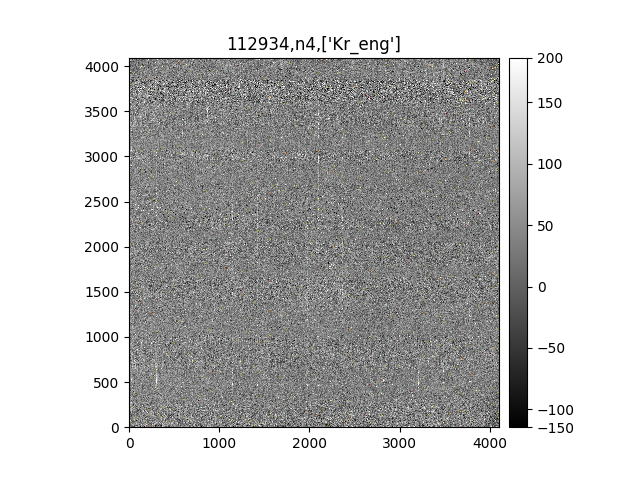

In [256]:
fig = 3; plt.close(fig); fig = plt.figure(fig)

dispVPHG = afwDisplay.Display(fig)
dispVPHG.scale("linear", min="zscale")
dispVPHG.mtv(exp, f'{visit},{cam},{lamps}')

In [257]:
waves = filterPeakList(LAMlines, arm, lamps[0]).wavelength.unique()

In [258]:
lines = ReadLineListTask().run(detectorMap=detMap, metadata=exp.getMetadata())
waves = lines.wavelength

In [ ]:
waves

In [169]:
centFibers

[339]

In [259]:
vphg = []
if dMapUse is True:
    data = []
    for wave in waves:
        for fiber in centFibers:
            pt = detMap.findPoint(fiber + (specId-1)*651, wave)
            vphg.append({"fiberId": fiber + (specId-1)*651, "wavelength": wave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber})

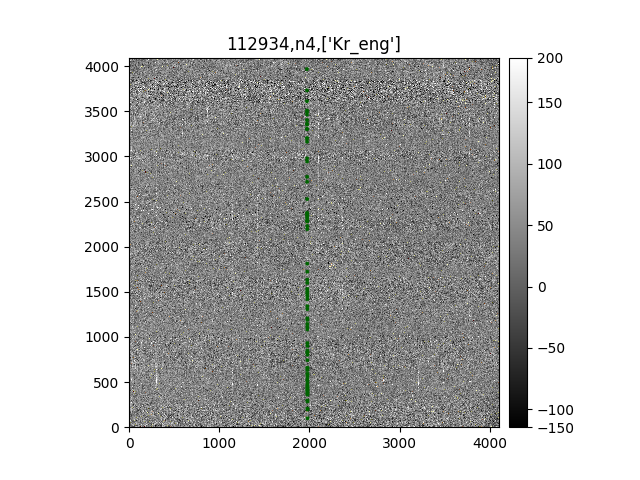

In [260]:
# overlay selected wave for each fiber used
dotColor = "darkgreen"
with dispVPHG.Buffering():
    for  val in vphg:
        dispVPHG.dot("x",val['x'], val['y'], size=10, ctype=dotColor)

In [261]:
dfVPHG = pd.DataFrame.from_dict(vphg).sort_values("y")
dfVPHG = dfVPHG.dropna()
dfVPHG

,fiberId,wavelength,x,y,fiber
5,2289,945.3470,1978.055996,98.697457,336
6,2289,953.4900,1977.929638,195.947842,336
7,2289,954.3510,1977.915634,206.231484,336
8,2289,960.9800,1977.812337,285.412441,336
9,2289,961.8270,1977.798491,295.530621,336
...,...,...,...,...,...
76,2289,1223.2750,1972.756583,3495.511956,336
77,2289,1224.3910,1972.731459,3509.694979,336
78,2289,1232.4450,1972.547185,3612.244781,336
79,2289,1241.8485,1972.328093,3732.437611,336


In [262]:
shiftPx = 0
shiftPy = 0

In [263]:
if dMapUse is False:
    
    vphg = []
    for name, group in dfVPHG.groupby(["fiber", "wavelength"]):
        [fiberId] = group["fiberId"].values
        [wave] = group["wavelength"].values
        [fiber] = group["fiber"].values
        [x0] =  group["x"].values + shiftPx
        [y0] =  group["y"].values + shiftPy
        x, y = estimateCOM(exp.image.array, x0, y0, roi_size=roi_size, doBck=True)
        vphg.append({"fiberId": fiberId, "wavelength": wave, "x": x, "y": y, "fiber": fiber })
        print(fiber, wave, x-x0, y-y0)

In [264]:
sdata = dfVPHG
fname=0
#fiber_name = 339

In [265]:
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_VPHGRoll_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)

/work/moritani/spsAIT/202407/alignment_N4/Subaru_SM4_N4_VPHGRoll_before_112934__2024-07-17T23h42.png


[-6.33321617e+02  1.25292620e+06]
-113257909.87340815
Shift 6.2 px over 3869.0 px 
VPHG Roll Shim: -282 um 



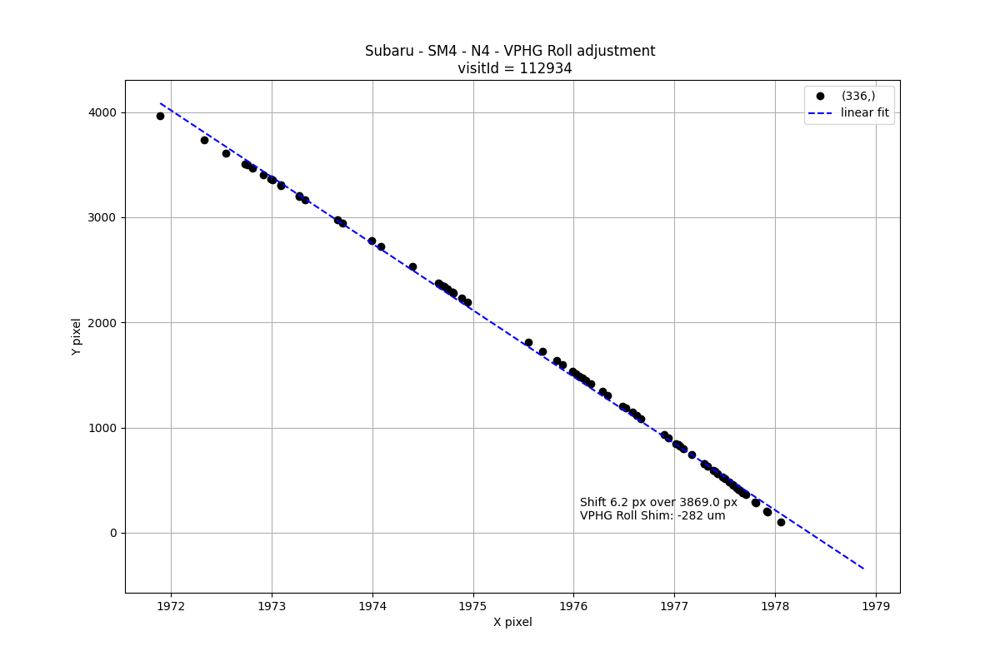

In [266]:
vphgRollShim = plot_vphg_roll(dfVPHG, dataId, centFibers, site=site, fname=fname, doSavePlot=savePlot)

In [ ]:
currentMeasure = 81.21 # mm

print(f"Value wanted: {currentMeasure + vphgRollShim*1e-3:.2f} mm")

In [ ]:
currentMeasure = 80.95 # mm

print(f"Value wanted: {currentMeasure + vphgRollShim*1e-3:.2f} mm")

In [ ]:
roi_size = 15

## Do the VPHG alignment 
### Measure after alignment

(2023.11.12) Need to take data

In [211]:
# Image after alignment
# at LAM
expId = 0
# Using SM3 IIS, Ar
visit = 101822 # Note: 101807 and 101808 shows that one fiber got out of the detector. 1mm shim was on the front removed

**Run biitstrap**

Using SM3 IIS --- Ar: 101822, halgen: 101821

bootstrapDetectorMap.py /work/drp/ --calib=/work/drp/CALIB/ --rerun moritani/sm1-2023/bootstrap --flatId visit=101821 arm=n --arcId visit=101822 arm=n -c isr.doBias=False isr.doDark=False isr.doFlat=False isr.doLinearize=False isr.doIPC=True --no-versions --clobber-config -c profiles.findThreshold=800 profiles.associationDepth=20 profiles.convolveGrowMask=2 profiles.pruneMinFrac=0.6 findLines.doSubtractContinuum=False -c spectralOffset=0 spatialOffset=0 -c -C /work/moritani/spsAIT/202311/bootstrap.iic.config


Note: `config.badFibers=[651]` because one fiber is out of the detector

```
bootstrap INFO: Found 283 lines in 15 traces
bootstrap INFO: Matched 194 lines
bootstrap INFO: Median difference from detectorMap: -53.333614,-0.545185 pixels
bootstrap INFO: Fit 124/194 points, rms: x=0.115038 y=0.179975 total=0.085042 pixels
```

In [212]:
dataId = dict(visit=visit, arm=arm, spectrograph=specId)
exp = butler.get("calexp", dataId)

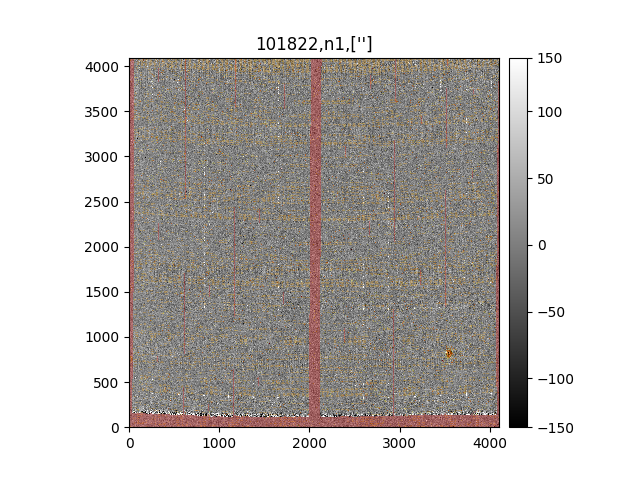

In [213]:
fig = 4; plt.close(fig); fig = plt.figure(fig)

dispVPHGRoll2 = afwDisplay.Display(fig)
dispVPHGRoll2.scale("linear",  min="zscale")
dispVPHGRoll2.mtv(exp, f'{visit},{cam},{lamps}')

In [214]:
detMap = DetectorMap.readFits(f"/work/drp/rerun/moritani/sm1-2023/bootstrap/DETECTORMAP/pfsDetectorMap-{visit:06d}-{cam}.fits")

In [215]:
vphgAfter = []
if dMapUse is True:
    data = []
    for wave in waves:
        for fiber in centFibers:
            pt = detMap.findPoint(fiber + (specId-1)*651, wave)
            vphgAfter.append({"fiberId": fiber + (specId-1)*651, "wavelength": wave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber})

In [217]:
roi_size = 15
seek_size = None

shiftPx = +25
shiftPy = 0

In [ ]:

vphgAfter = []
for name, group in dfVPHG.groupby(["fiber", "wavelength"]):
    [fiberId] = group["fiberId"].values
    [wave] = group["wavelength"].values
    [fiber] = group["fiber"].values
    [x0] =  group["x"].values + shiftPx
    [y0] =  group["y"].values + shiftPy
    x, y = estimateCOM(exp.image.array, x0, y0, roi_size=roi_size, doBck=True, seek_size=seek_size)
    vphgAfter.append({"fiberId": fiberId, "wavelength": wave, "x": x, "y": y, "fiber": fiber })
    print(fiber, wave, x-x0, y-y0)

In [275]:
np.rad2deg(np.arctan2(-14,3146))*3600*VPHG_Set

-795.8123622346886

In [218]:
# overlay selected wave for each fiber used
ls = "+"
alpha = 0.5
color= "r"

with dispVPHGRoll2.Buffering():
    for origi, val in zip(vphg, vphgAfter):
        dispVPHGRoll2.dot("o",origi['x'], origi['y'], size=roi_size, ctype="red")
        dispVPHGRoll2.dot("x",val['x'], val['y'], size=10, ctype="darkorange")

In [223]:
dfVPHGAfter = pd.DataFrame.from_dict(vphgAfter).sort_values("y")
dfVPHGAfter = dfVPHGAfter.dropna()
dfVPHGAfter

,fiberId,wavelength,x,y,fiber
67,339,940.41609,1916.841036,17.195472,339
68,339,942.23133,1916.863355,38.834001,339
69,339,944.22397,1916.887656,62.586547,339
70,339,946.11228,1916.910538,85.095034,339
71,339,947.94298,1916.932588,106.916620,339
...,...,...,...,...,...
58,339,1270.45000,1919.306826,4071.055901,339
59,339,1270.70000,1919.307447,4074.301013,339
60,339,1271.02500,1919.308264,4078.520416,339
61,339,1271.70800,1919.310024,4087.390458,339


In [219]:
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_VPHGRoll_After_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)

/work/moritani/spsAIT/202311/Subaru_SM1_N1_VPHGRoll_After_101822__2023-11-13T10h06.png


[ 1.72047701e+03 -3.29833564e+06]
307675633.5689027
Shift 2.5 px over 4074.3 px 
VPHG Roll Shim: 104 um 



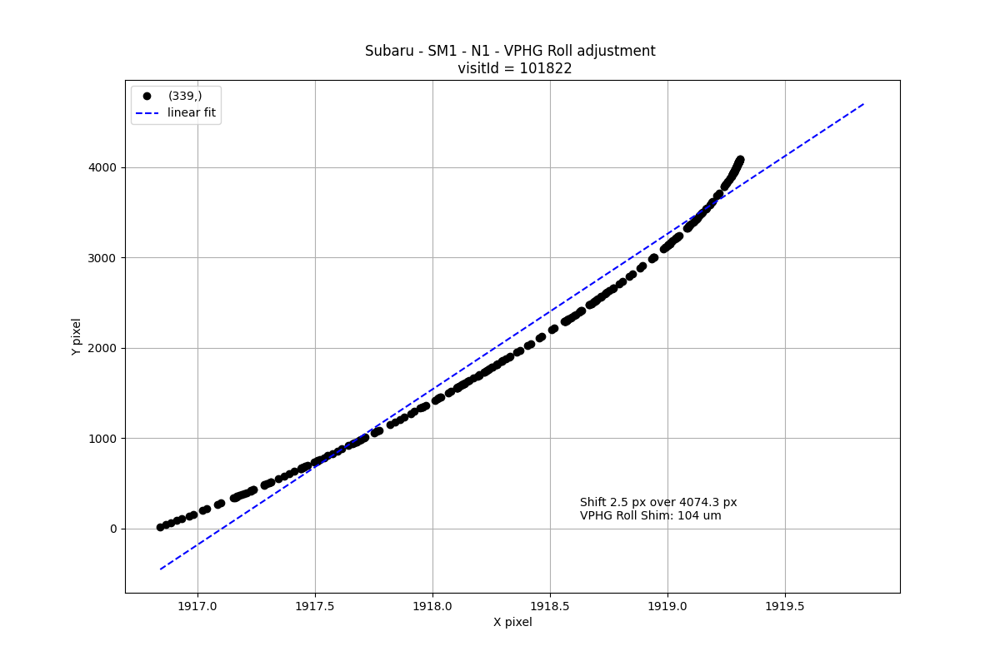

In [224]:
vphgRollShim = plot_vphg_roll(dfVPHGAfter, dataId, centFibers, site=site, fname=fname, doSavePlot=savePlot)

In [ ]:
np.rad2deg(math.atan(0.8/3052))*3600*VPHG_Set


In [ ]:
math.atan(0.8/3052)

In [ ]:
vphgRollShim

In [ ]:
currentMeasure = 80.30 # mm

print(f"Value wanted: {currentMeasure + vphgRollShim*1e-3:.2f} mm")

In [ ]:
currentMeasure = 80.43 # mm

print(f"Value wanted: {currentMeasure + vphgRollShim*1e-3:.2f} mm")

In [ ]:
from scipy.stats import sigmaclip

In [ ]:
df = dfVPHGAfter
fibers = centFibers
fig, ax = plt.subplots(figsize=(12,8))
plt.grid()

plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.title(f"{site} - SM{dataId['spectrograph']} - {dataId['arm'].upper()}{dataId['spectrograph']} - VPHG Roll adjustment \n visitId = {dataId['visit']}")


x0 = df.x.values[0] 



lns1 = ax.plot( df.x, df.y, 'o', label=f"{*fibers,}", color="black")

fact = 2
c, low, upp = sigmaclip(df.x, fact, fact)
dffit = df[df.x.isin(c)]

# fit data 
popt = np.polyfit( dffit.x, dffit.y, 1)
print(popt)
t = np.arange(df.x.min(), df.x.max()+0.1)
lns2 = ax.plot(t,np.polyval(popt, t), 'b--', label="linear fit")

annot = f"Shift { df.x.max() - df.x.min():.1f} px over {df.y.max() - df.y.min():.1f} px \n" 

Roll_VPHG_shim_fit = np.rad2deg(1/popt[0])*3600*VPHG_Set
annot += f"VPHG Roll Shim: {Roll_VPHG_shim_fit:.0f} um \n"

print(np.rad2deg(popt[0])*3600*VPHG_Set)

print(annot)

plt.annotate(annot, xy=(.58,.2),xycoords="figure fraction")

lns = lns1+lns2
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)


if False:
#fig.patch.set_alpha(0.5)
    plt.savefig(fname)
#        plt.savefig(fname, transparent=True)


# Camera Unit Vertical tilt Alignment

for Vis CU horizontal is along X axis

## Before adjustment

In [72]:
def getTiltCUShim(shift, doPrint=True):
    '''
    shift in pixel
    '''
    F_CU = 300. #mm
    pix_size = 15e-3
    e = 523.639 #mm entraxe en sperolinders de la CU
    shift_mm = shift * pix_size
    shim = e*shift_mm/F_CU
    if doPrint:
        annot = "CU tilt \n"
        annot += "Shift %.2f px\n"%shift
        annot += "Shift %.2f microns\n"%(shift*15)
        annot += "angle %.3f deg\n"%(math.degrees(math.atan(shift_mm/F_CU)))
        annot += "angle %.3f arsec\n"%(math.degrees(math.atan(shift_mm/F_CU))*3600)
        annot += "shim %.3f mm"%(e*shift_mm/F_CU)
        print(annot)
    return 

In [73]:
#expId = 0
visit = 112917

In [74]:
dataId = dict(visit=visit, arm=arm, spectrograph=specId)
exp = butler.get("calexp", dataId)

In [75]:
pfsConfig = butler.get("pfsConfig", dataId).select(spectrograph=specId)
# DCB
#pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.DCB]
# IIS
pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.ENGINEERING]
fiberIds = pfsConfig.fiberId[pfsConfig.spectrograph == specId]

In [76]:
# detectormap

simMap = DetectorMap.readFits("/work/drp//CALIB/DETECTORMAP/pfsDetectorMap-000000-n4.fits")
# bootstrapped detectorMap (after previous alignment)
detMap = DetectorMap.readFits(f"/work/drp/rerun/moritani/sm4-202407/bootstrap/DETECTORMAP/pfsDetectorMap-{visit:06d}-{cam}.fits")

/work/moritani/codes/drp_stella/python/pfs/drp/stella/utils/display.py:244: UserWarning: addPfsCursor: Using an old version of display_matplotlib. Ideally need one that has the method DisplayImpl.set_format_coord. Using workaround.
  warnings.warn("addPfsCursor: Using an old version of display_matplotlib. "


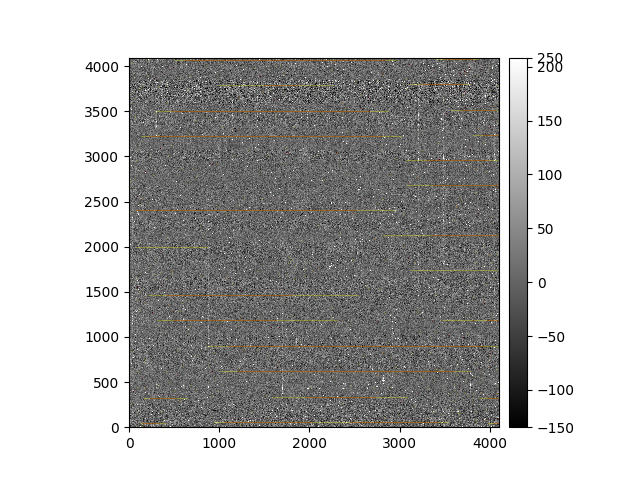

In [77]:
fig = 5; plt.close(fig); fig = plt.figure(fig)

dispHTilt = afwDisplay.Display(fig)
dispHTilt.scale("linear",  min="zscale")

dispHTilt.mtv(exp)
addPfsCursor(dispHTilt, detMap)


In [80]:
# Retrieve position of this wave for each fiber 
# for calculation
simdata = []
for fiber in pfsConfig.fiberId:
    for midWave in midWaves:
        pt = simMap.findPoint(fiber, midWave)
        simdata.append({"fiberId": fiber, "wavelength": midWave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber - (specId-1)*651  }) 

In [81]:
sim = pd.DataFrame.from_dict(simdata)

In [82]:
# Retrieve position of this wave for each fiber 
# for calculation
data = []
for fiber in pfsConfig.fiberId:
    for midWave in midWaves:
        pt = detMap.findPoint(fiber, midWave)
        data.append({"fiberId": fiber, "wavelength": midWave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber - (specId-1)*651  })
    

In [83]:
df = pd.DataFrame.from_dict(data).dropna()

In [84]:
data=df[df.wavelength == midWaves[0]]
fitparabola(data.x, data.y)

,x,y
0,38.565027,1815.304810
1,38.965665,1815.277268
2,39.366304,1815.249731
3,39.766942,1815.222200
4,40.167580,1815.194674
...,...,...
9995,4042.943583,1806.645194
9996,4043.344222,1806.671009
9997,4043.744860,1806.696828
9998,4044.145498,1806.722654


In [85]:
naxis1 = exp.getDimensions().getX() #px
naxis2 = exp.getDimensions().getY() #px
#pix_size = 15 #µm

In [86]:
xsize = exp.getDimensions().getX()
ysize = exp.getDimensions().getY()
F_CU = 300. #mm
pix_size = 15e-3
e = 523.639 #mm entraxe en sperolinders de la CU

In [88]:
def getTiltCUShim(shift, doPrint=True):
    '''
    shift in pixel
    '''
    F_CU = 300. #mm
    pix_size = 15e-3
    e = 523.639 #mm entraxe en sperolinders de la CU
    shift_mm = shift * pix_size
    shim = e*shift_mm/F_CU
    if doPrint:
        annot = "CU tilt \n"
        annot += "Shift %.2f px\n"%shift
        annot += "Shift %.2f microns\n"%(shift*15)
        annot += "angle %.3f deg\n"%(math.degrees(math.atan(shift_mm/F_CU)))
        annot += "angle %.3f arsec\n"%(math.degrees(math.atan(shift_mm/F_CU))*3600)
        annot += "shim %.3f mm"%(e*shift_mm/F_CU)
        print(annot)
    return 

In [87]:
color="b"

CU vertical tilt 
Center 2105.86 
Shift -57.86 px
Shift -867.87 microns
angle -0.166 deg
angle -596.702 arsec
shim -1.515 mm


'    \naxy = ax.twinx()\nlns2 = axy.plot("x", "y", "*", label=f"{midWaves[1]}nm", data=df[df.wavelength == midWaves[1]], color="r")\ndata = df[df.wavelength == midWaves[1]]\nparab = fitparabola(data.x, data.y)\nlns2p = axy.plot("x", "y", "--", label=f"fit {midWaves[1]}nm", data =parab , c="r")\n# added these three lines\nlns = lns1+lns2+lns1p+lns2p\nlabs = [l.get_label() for l in lns]\nax.legend(lns, labs, loc=0)\n'

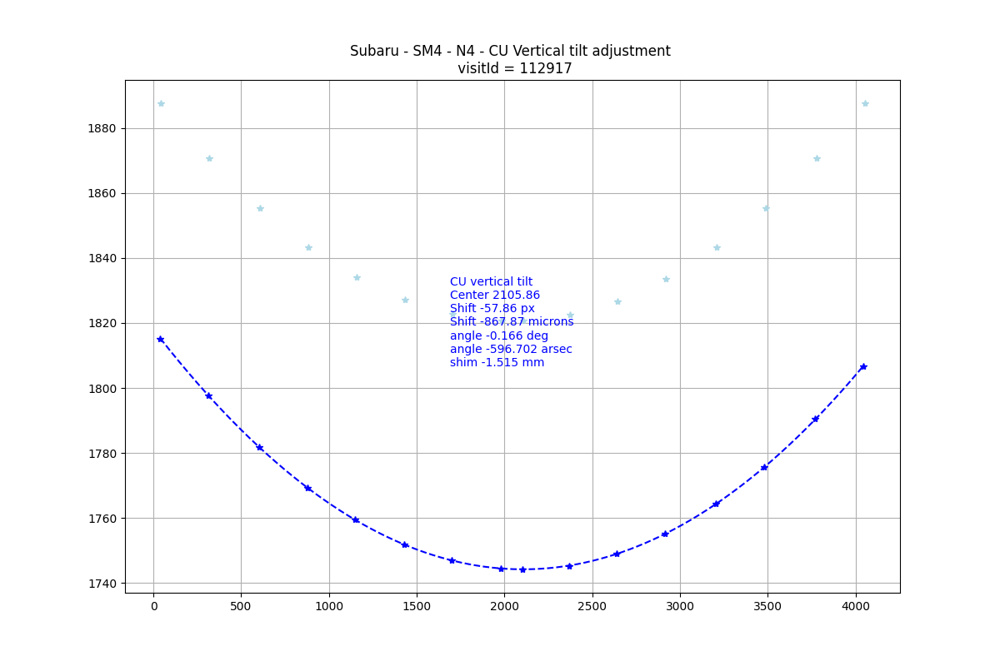

In [88]:
fig, ax = plt.subplots(figsize=(12,8))
plt.grid()
plt.title(f"{site} - SM{dataId['spectrograph']} - {dataId['arm'].upper()}{dataId['spectrograph']} - CU Vertical tilt adjustment \n visitId = {dataId['visit']}")

lns1 = ax.plot("x", "y", "*", label=f"{midWaves[0]}nm", data=df[df.wavelength == midWaves[0]], c="b")
ax.plot("x", "y", "*", label=f"{midWaves[0]}nm", data=sim[sim.wavelength == midWaves[0]], c="lightblue")

#secax = ax.secondary_xaxis(1, functions=(px2fiber, fiber2px))
#secax.set_xlabel('Fiber')
data = df[df.wavelength == midWaves[0]]
parab = fitparabola(data.x, data.y)
lns1p = ax.plot("x", "y", "--", label=f"fit {midWaves[0]}nm", data =parab , c="b")


center = parab.focus
xshift = xsize/2 - center
xshift_mm = xshift*pix_size


annot = "CU vertical tilt \n"
annot += "Center %.2f \n"%center
annot += "Shift %.2f px\n"%xshift
annot += "Shift %.2f microns\n"%(xshift*15)
annot += "angle %.3f deg\n"%(math.degrees(math.atan(xshift_mm/F_CU)))
annot += "angle %.3f arsec\n"%(math.degrees(math.atan(xshift_mm/F_CU))*3600)
annot += "shim %.3f mm"%(e*xshift_mm/F_CU)

print(annot)


ax.annotate(annot,  xy=(.45,.45),xycoords="figure fraction", color=color)

'''    
axy = ax.twinx()
lns2 = axy.plot("x", "y", "*", label=f"{midWaves[1]}nm", data=df[df.wavelength == midWaves[1]], color="r")
data = df[df.wavelength == midWaves[1]]
parab = fitparabola(data.x, data.y)
lns2p = axy.plot("x", "y", "--", label=f"fit {midWaves[1]}nm", data =parab , c="r")
# added these three lines
lns = lns1+lns2+lns1p+lns2p
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)
'''

In [ ]:
getTiltCUShim(-3)

## After ajustment

**Run bootstrap**

Using SM3 IIS --- Ar: 101823, halgen: 101824

bootstrapDetectorMap.py /work/drp/ --calib=/work/drp/CALIB/ --rerun moritani/sm1-2023/bootstrap --flatId visit=101824 arm=n --arcId visit=101823 arm=n -c isr.doBias=False isr.doDark=False isr.doFlat=False isr.doLinearize=False isr.doIPC=True --no-versions --clobber-config -c profiles.findThreshold=800 profiles.associationDepth=20 profiles.convolveGrowMask=2 profiles.pruneMinFrac=0.6 findLines.doSubtractContinuum=False -c spectralOffset=0 spatialOffset=0 -c -C /work/moritani/spsAIT/202311/bootstrap.iic.config


```
bootstrap INFO: Found 299 lines in 16 traces
bootstrap INFO: Matched 166 lines
bootstrap INFO: Median difference from detectorMap: -22.406420,-4.399661 pixels
bootstrap INFO: Fit 139/166 points, rms: x=0.083822 y=0.168437 total=0.086609 pixels
```

Using SM3 IIS --- Ar: 101831, halgen: 101832

bootstrapDetectorMap.py /work/drp/ --calib=/work/drp/CALIB/ --rerun moritani/sm1-2023/bootstrap --flatId visit=101832 arm=n --arcId visit=101831 arm=n -c isr.doBias=False isr.doDark=False isr.doFlat=False isr.doLinearize=False isr.doIPC=True --no-versions --clobber-config -c profiles.findThreshold=800 profiles.associationDepth=20 profiles.convolveGrowMask=2 profiles.pruneMinFrac=0.6 findLines.doSubtractContinuum=False -c spectralOffset=50 spatialOffset=0 -c -C /work/moritani/spsAIT/202311/bootstrap.iic.config


```
bootstrap INFO: Found 279 lines in 16 traces
bootstrap INFO: Matched 53 lines
bootstrap INFO: Median difference from detectorMap: -16.176601,-3.118907 pixels
bootstrap INFO: Fit 6/53 points, rms: x=0.066495 y=0.035003 total=0.045139 pixels
```
spectralOffset=45
```
bootstrap INFO: Found 279 lines in 16 traces
bootstrap INFO: Matched 50 lines
bootstrap INFO: Median difference from detectorMap: -16.151196,0.014193 pixels
bootstrap INFO: Fit 19/50 points, rms: x=0.118555 y=0.619655 total=0.465625 pixels
```

spectralOffset=-5
```
bootstrap INFO: Found 279 lines in 16 traces
bootstrap INFO: Matched 141 lines
bootstrap INFO: Median difference from detectorMap: -14.256641,-8.828723 pixels
bootstrap INFO: Fit 127/141 points, rms: x=0.076303 y=0.244060 total=0.143224 pixels
```


In [58]:
# Image after alignment
#expId = 0
# 700um shim at position A.. It was not enough
#visit = 101823
# 1mm shim at postion A
visit = 101831

In [20]:
dataId = dict(visit=visit, arm=arm, spectrograph=specId)
exp = butler.get("calexp", dataId)

In [21]:
pfsConfig = butler.get("pfsConfig", dataId).select(spectrograph=specId)
# DCB
#pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.DCB]
# IIS
pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.ENGINEERING]
fiberIds = pfsConfig.fiberId[pfsConfig.spectrograph == specId]

In [59]:
# detectormap

simMap = DetectorMap.readFits("/work/drp//CALIB/DETECTORMAP/pfsDetectorMap-000000-n1.fits")
# bootstrapped detectorMap (after previous alignment)
detMap = DetectorMap.readFits(f"/work/drp/rerun/moritani/sm1-2023/bootstrap/DETECTORMAP/pfsDetectorMap-{visit:06d}-{cam}.fits")

/work/moritani/codes/drp_stella/python/pfs/drp/stella/utils/display.py:243: UserWarning: addPfsCursor: Using an old version of display_matplotlib. Ideally need one that has the method DisplayImpl.set_format_coord. Using workaround.
  warnings.warn("addPfsCursor: Using an old version of display_matplotlib. "


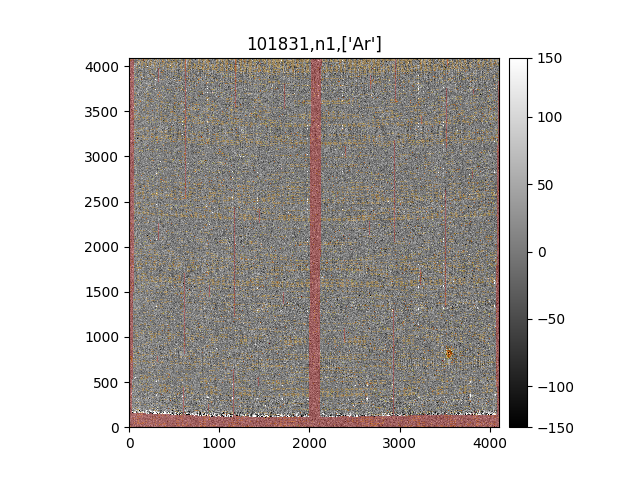

In [60]:
fig = 7; plt.close(fig); fig = plt.figure(fig)

dispHTilt = afwDisplay.Display(fig)
dispHTilt.scale("linear",  min="zscale")

lamps = ['Ar']
dispHTilt.mtv(exp, f'{visit},{cam},{lamps}')
addPfsCursor(dispHTilt, detMap)

In [290]:
from pfs.drp.stella.referenceLine import ReferenceLineStatus
status = ReferenceLineStatus.LAM_FOCUS | ReferenceLineStatus.LAM_IMAGEQUALITY  # Selecting both kinds of LAM flags
#select = (lines.status & status) != 0  # Bit is set for status flags

In [45]:
from pfs.drp.stella.readLineList import ReadLineListTask
metadata=exp.getMetadata()
metadata['lamps']=['Ar']
lines = ReadLineListTask().run(detectorMap=detMap, metadata=metadata)
#select = (lines.status & status) != 0  # Bit is set for status flags

In [56]:
np.sort(lines.wavelength)

array([ 937.68905,  937.85335,  938.54854,  938.92834,  940.41609,
        942.23133,  944.22397,  946.11228,  947.94298,  950.54218,
        952.19658,  955.51288,  956.99633,  961.03618,  962.36039,
        967.11552,  967.68878,  968.30364,  968.49005,  969.31627,
        970.19231,  971.43699,  972.24966,  973.77033,  974.07606,
        974.78875,  974.89528,  979.21005,  979.38035,  980.23573,
        981.46751,  981.92889,  982.05772,  985.11855,  987.48439,
        989.7458 ,  991.73909,  994.43692,  994.49189,  994.79897,
        994.92366,  995.04739,  995.10921,  995.93456,  996.46622,
        997.50831, 1000.27371, 1001.40866, 1001.5555 , 1001.67319,
       1002.82   , 1004.62664, 1006.34725, 1008.52314, 1010.63741,
       1012.67837, 1015.5756 , 1017.44881, 1018.38261, 1019.25   ,
       1020.58446, 1021.15767, 1021.38668, 1022.85868, 1023.34636,
       1027.38975, 1028.75883, 1028.94573, 1029.88458, 1035.01277,
       1037.57196, 1039.93871, 1042.12185, 1045.33647, 1047.18

In [61]:
lamps = ['Ar']
select = filterPeakList(LAMlines, arm, lamps)
select = select.wavelength.sort_values().unique()

In [57]:
select

array([ 966.0435,  978.7186, 1167.1904, 1240.6221, 1270.5756])

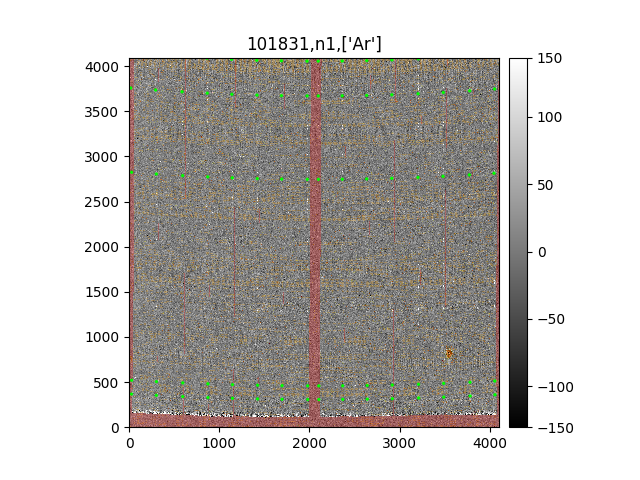

In [62]:
detMap.display(dispHTilt, fiberId=pfsConfig.fiberId, wavelengths=select, plotTraces=False);
#detMap.display(dispHTilt, fiberId=pfsConfig.fiberId, wavelengths=lines.wavelength, plotTraces=False);
#detMap.display(display, fiberId=pfsConfig.fiberId, plotTraces=False);

In [65]:
# Retrieve position of this wave for each fiber 
# for calculation
simdata = []
for fiber in pfsConfig.fiberId:
    for midWave in midWaves:
        pt = simMap.findPoint(fiber, midWave)
        simdata.append({"fiberId": fiber, "wavelength": midWave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber - (specId-1)*651  }) 

In [66]:
sim = pd.DataFrame.from_dict(simdata)

In [67]:
# Retrieve position of this wave for each fiber 
# for calculation
data = []
for fiber in pfsConfig.fiberId:
    for midWave in midWaves:
        pt = detMap.findPoint(fiber, midWave)
        data.append({"fiberId": fiber, "wavelength": midWave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber - (specId-1)*651  })
    

In [68]:
df = pd.DataFrame.from_dict(data).dropna()

In [69]:
data=df[df.wavelength == midWaves[0]]
fitparabola(data.x, data.y)

,x,y
0,33.185210,1807.846867
1,33.586416,1807.819262
2,33.987623,1807.791662
3,34.388830,1807.764067
4,34.790037,1807.736478
...,...,...
9995,4043.247084,1798.438773
9996,4043.648291,1798.464501
9997,4044.049498,1798.490234
9998,4044.450705,1798.515972


In [70]:
naxis1 = exp.getDimensions().getX() #px
naxis2 = exp.getDimensions().getY() #px
#pix_size = 15 #µm

In [71]:
xsize = exp.getDimensions().getX()
ysize = exp.getDimensions().getY()
F_CU = 300. #mm
pix_size = 15e-3
e = 523.639 #mm entraxe en sperolinders de la CU

In [73]:
color="b"

CU vertical tilt 
Center 2109.03 
Shift -61.03 px
Shift -915.44 microns
angle -0.175 deg
angle -629.406 arsec
shim -1.598 mm


'    \naxy = ax.twinx()\nlns2 = axy.plot("x", "y", "*", label=f"{midWaves[1]}nm", data=df[df.wavelength == midWaves[1]], color="r")\ndata = df[df.wavelength == midWaves[1]]\nparab = fitparabola(data.x, data.y)\nlns2p = axy.plot("x", "y", "--", label=f"fit {midWaves[1]}nm", data =parab , c="r")\n# added these three lines\nlns = lns1+lns2+lns1p+lns2p\nlabs = [l.get_label() for l in lns]\nax.legend(lns, labs, loc=0)\n'

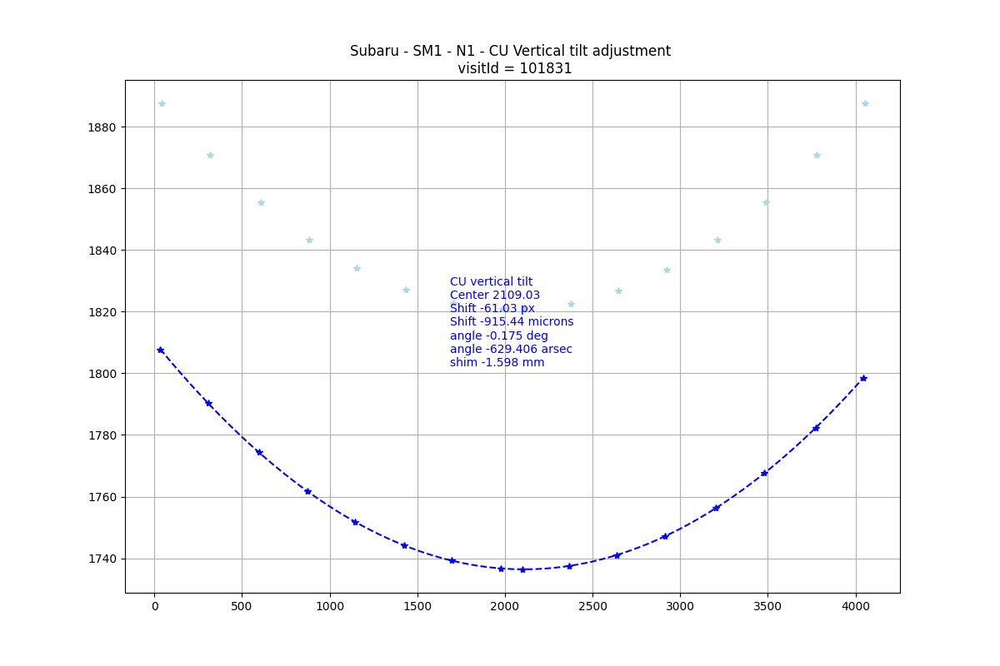

In [74]:
fig, ax = plt.subplots(figsize=(12,8))
plt.grid()
plt.title(f"{site} - SM{dataId['spectrograph']} - {dataId['arm'].upper()}{dataId['spectrograph']} - CU Vertical tilt adjustment \n visitId = {dataId['visit']}")

lns1 = ax.plot("x", "y", "*", label=f"{midWaves[0]}nm", data=df[df.wavelength == midWaves[0]], c="b")
ax.plot("x", "y", "*", label=f"{midWaves[0]}nm", data=sim[sim.wavelength == midWaves[0]], c="lightblue")

#secax = ax.secondary_xaxis(1, functions=(px2fiber, fiber2px))
#secax.set_xlabel('Fiber')
data = df[df.wavelength == midWaves[0]]
parab = fitparabola(data.x, data.y)
lns1p = ax.plot("x", "y", "--", label=f"fit {midWaves[0]}nm", data =parab , c="b")


center = parab.focus
xshift = xsize/2 - center
xshift_mm = xshift*pix_size


annot = "CU vertical tilt \n"
annot += "Center %.2f \n"%center
annot += "Shift %.2f px\n"%xshift
annot += "Shift %.2f microns\n"%(xshift*15)
annot += "angle %.3f deg\n"%(math.degrees(math.atan(xshift_mm/F_CU)))
annot += "angle %.3f arsec\n"%(math.degrees(math.atan(xshift_mm/F_CU))*3600)
annot += "shim %.3f mm"%(e*xshift_mm/F_CU)

print(annot)


ax.annotate(annot,  xy=(.45,.45),xycoords="figure fraction", color=color)

'''    
axy = ax.twinx()
lns2 = axy.plot("x", "y", "*", label=f"{midWaves[1]}nm", data=df[df.wavelength == midWaves[1]], color="r")
data = df[df.wavelength == midWaves[1]]
parab = fitparabola(data.x, data.y)
lns2p = axy.plot("x", "y", "--", label=f"fit {midWaves[1]}nm", data =parab , c="r")
# added these three lines
lns = lns1+lns2+lns1p+lns2p
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)
'''

In [ ]:
# detectormap

simMap = DetectorMap.readFits("/data/drp/sps/CALIB/DETECTORMAP/pfsDetectorMap-000000-r4.fits")
# bootstrapped detectorMap (after previous alignment)

#detMap = DetectorMap.readFits("/data/drp/sps/rerun/fmadec/n2/bootstrap/DETECTORMAP/pfsDetectorMap-048879-n2.fits")
#detMap = DetectorMap.readFits("/data/drp/sps/rerun/fmadec/n2/bootstrap/DETECTORMAP/pfsDetectorMap-048886-n2.fits")
#detMap = DetectorMap.readFits("/data/drp/sps/rerun/fmadec/n2/bootstrap/DETECTORMAP/pfsDetectorMap-048888-n2.fits")


    

In [ ]:
fig = 3; plt.close(fig); fig = plt.figure(fig)

dispHTilt2 = afwDisplay.Display(fig)
dispHTilt2.scale("linear",  min="zscale")

dispHTilt2.mtv(exp)
addPfsCursor(dispHTilt2, detMap)


In [ ]:
# Retrieve position of this wave for each fiber 
# for calculation
simdata = []
for fiber in pfsConfig.fiberId:
    for midWave in midWaves:
        pt = simMap.findPoint(fiber, midWave)
        simdata.append({"fiberId": fiber, "wavelength": midWave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber - (specId-1)*651  })
    

In [ ]:
sim = pd.DataFrame.from_dict(simdata)

In [ ]:
# Retrieve position of this wave for each fiber 
# for calculation
data = []
for fiber in pfsConfig.fiberId:
    for midWave in midWaves:
        pt = detMap.findPoint(fiber, midWave)
        data.append({"fiberId": fiber, "wavelength": midWave, "x": pt.getX(), "y": pt.getY(), "fiber": fiber - (specId-1)*651  })
    

In [ ]:
df = pd.DataFrame.from_dict(data)

In [ ]:
naxis1 = exp.getDimensions().getX() #px
naxis2 = exp.getDimensions().getY() #px
pix_size = 15 #µm

In [ ]:
xsize = exp.getDimensions().getX()
ysize = exp.getDimensions().getY()
F_CU = 300. #mm
pix_size = 15e-3
e = 523.639 #mm entraxe en sperolinders de la CU

In [ ]:
print(xsize, ysize)

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))
plt.grid()
plt.title(f"{site} - SM{dataId['spectrograph']} - {dataId['arm'].upper()}{dataId['spectrograph']} - CU Roll adjustment \n visitId = {dataId['visit']}")

lns1 = ax.plot("x", "y", "*", label=f"{midWaves[0]}nm", data=df[df.wavelength == midWaves[0]], c="b")
secax = ax.secondary_xaxis(1, functions=(px2fiber, fiber2px))
secax.set_xlabel('Fiber')
data = df[df.wavelength == midWaves[0]]
parab = fitparabola(data.x, data.y)
lns1p = ax.plot("x", "y", "--", label=f"fit {midWaves[0]}nm", data =parab , c="b")


center = parab.focus
xshift = xsize/2 - center
xshift_mm = xshift*pix_size


annot = "CU vertical tilt \n"
annot += "Center %.2f \n"%center
annot += "Shift %.2f px\n"%xshift
annot += "Shift %.2f microns\n"%(xshift*15)
annot += "angle %.3f deg\n"%(math.degrees(math.atan(xshift_mm/F_CU)))
annot += "angle %.3f arsec\n"%(math.degrees(math.atan(xshift_mm/F_CU))*3600)
annot += "shim %.3f mm"%(e*xshift_mm/F_CU)

print(annot)


ax.annotate(annot,  xy=(.45,.45),xycoords="figure fraction", color=color)

    
axy = ax.twinx()
lns2 = axy.plot("x", "y", "*", label=f"{midWaves[1]}nm", data=df[df.wavelength == midWaves[1]], color="r")
data = df[df.wavelength == midWaves[1]]
parab = fitparabola(data.x, data.y)
lns2p = axy.plot("x", "y", "--", label=f"fit {midWaves[1]}nm", data =parab , c="r")
# added these three lines
lns = lns1+lns2+lns1p+lns2p
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))
plt.grid()
plt.title(f"{site} - SM{dataId['spectrograph']} - {dataId['arm'].upper()}{dataId['spectrograph']} - CU Roll adjustment \n visitId = {dataId['visit']}")

lns1 = ax.plot("x", "y", "*", label=f"{midWaves[0]}nm", data=df[df.wavelength == midWaves[0]], c="b")
secax = ax.secondary_xaxis(1, functions=(px2fiber, fiber2px))
secax.set_xlabel('Fiber')
data = df[df.wavelength == midWaves[0]]
parab = fitparabola(data.x, data.y)
lns1p = ax.plot("x", "y", "--", label=f"fit {midWaves[0]}nm", data =parab , c="b")

In [ ]:
center = parab.focus
xshift = xsize/2 - center
xshift_mm = xshift*pix_size


annot = "CU vertical tilt \n"
annot += "Center %.2f \n"%center
annot += "Shift %.2f px\n"%xshift
annot += "Shift %.2f microns\n"%(xshift*15)
annot += "angle %.3f deg\n"%(math.degrees(math.atan(xshift_mm/F_CU)))
annot += "angle %.3f arsec\n"%(math.degrees(math.atan(xshift_mm/F_CU))*3600)
annot += "shim %.3f mm"%(e*xshift_mm/F_CU)

print(annot)


ax.annotate(annot,  xy=(.45,.45),xycoords="figure fraction", color=color)

    
axy = ax.twinx()
lns2 = axy.plot("x", "y", "*", label=f"{midWaves[1]}nm", data=df[df.wavelength == midWaves[1]], color="r")
data = df[df.wavelength == midWaves[1]]
parab = fitparabola(data.x, data.y)
lns2p = axy.plot("x", "y", "--", label=f"fit {midWaves[1]}nm", data =parab , c="r")
# added these three lines
lns = lns1+lns2+lns1p+lns2p
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

In [ ]:
4096/2

In [ ]:
parab.focus

In [ ]:
plot_CU_roll(df, dataId, midWaves)

# Camera Unit Horizontal tilt Alignment (Spectrum alignment on detector)

In [1]:
import sys

sys.path.append('/work/moritani/codes/dev_sps_analysis/notebooks/optical/CamUnitAlignement/')
#sys.path.append('/work/moritani/spsAIT/lam_sps_analysis/notebooks/optical/CamUnitAlignement/')
from align import *

In [13]:
# IIS to check alignment (Kr) : initial check
visit = 144510
arm='n'
specId=2
cam=f"{arm}{specId}"

In [12]:
dataId = dict(visit=visit, arm=arm, spectrograph=specId)
exp = butler.get("calexp", dataId)

In [24]:
# detectormap
simMap = butler.get('detectorMap', dataId)
# or 
detMap = DetectorMap.readFits(f"/work/datastore/u/moritani/test2026006/n2/20260609T051910Z/detectorMap_bootstrap/detectorMap_bootstrap_PFS_{cam}_u_moritani_test2026006_{cam}_20260609T051910Z.fits")

#simMap = DetectorMap.readFits("/work/drp/CALIB/DETECTORMAP/pfsDetectorMap-104144-n1.fits")    

In [22]:
#dir(simMap)
simMap.metadata

SIMPLE = 1
// conforms to FITS standard
BITPIX = 8
// array data type
NAXIS = 0
// number of array dimensions
DATE-OBS = "2020-01-01T00:00:00"
CALIB_ID = "arm=n spectrograph=2"
MINX = 0
MINY = 0
MAXX = 4095
MAXY = 4095
PFS_DETECTORMAP_CLASS = "LayeredDetectorMap"
DAMD_VER = 2
DATA-TYP = "COMPARISON"
FRAMEID = "PFSB14451023"
EXP-ID = "PFSE00144510"
DETECTOR = "n2"
GAIN = 9999.0000000000
DET-TMP = 101.00070000000
DET-ID = 5
DISPAXIS = 1
DISPERSR = "VPH_n_1007_1107nm"
WAV-MIN = 940.00000000000
WAV-MAX = 1260.0000000000
WAVELEN = 1107.0000000000
SLIT = "PFS"
SLT-LEN = 1.0500000000000
SLT-WID = 1.0500000000000
W_VISIT = 144510
W_ARM = 3
W_SPMOD = 2
W_CAM = "n2"
W_SITE = "S"
W_PFDSGN = 4961375310986229509
W_PFDSNM = "cobraHome"
W_LGTSRC = "pfi"
W_VISIT0 = 144282
W_SEQID = 64058
W_SEQTYP = "scienceArc"
W_SEQNAM = "FT image quality"
W_SEQCMN = "central IIS - Kr"
W_GRPID = -9999
W_GRPNAM = "no available value"
MJD-STR = 61199.127865540
UT-STR = "03:04:07.583"
HST-STR = "17:04:07.583"
LST-STR = 

In [28]:
pfsConfig = butler.get("pfsConfig", dataId).select(spectrograph=specId)
# DCB
#pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.DCB]
# IIS
pfsConfig = pfsConfig[pfsConfig.targetType == TargetType.ENGINEERING]
fiberIds = pfsConfig.fiberId[pfsConfig.spectrograph == specId]

In [ ]:
#rbutler = dafPersist.Butler(f"{dataDir}")
butler.getKeys('raw')
#lamps = butler.queryMetadata('raw', ['lamps'], visit=visit, arm=arm) 
lamps = ['Kr']
print(lamps)

In [ ]:
fig = 8; plt.close(fig); fig = plt.figure(fig)

display = afwDisplay.Display(fig)
display.scale("linear", min="zscale")
display.mtv(exp, f'{visit},{cam},{lamps}')
addPfsCursor(display, detectorMap=detMap)

In [30]:
detMap.getWavelength()

array([[ 931.1746745 ,  931.25754237,  931.34041165, ..., 1262.53090195,
        1262.6071705 , 1262.6834351 ],
       [ 931.20060818,  931.28348846,  931.36637003, ..., 1262.57367435,
        1262.64994962, 1262.72622091],
       [ 931.22654948,  931.30944211,  931.39233591, ..., 1262.61645551,
        1262.69273747, 1262.76901545],
       ...,
       [ 931.65511459,  931.73803102,  931.82094832, ..., 1263.04143804,
        1263.11770823, 1263.19397437],
       [ 931.63051158,  931.71341617,  931.79632173, ..., 1263.00019338,
        1263.07645787, 1263.15271827],
       [ 931.60591554,  931.68880824,  931.771702  , ..., 1262.95895607,
        1263.0352149 , 1263.1114696 ]], shape=(616, 4096))

In [74]:
dir(detMap)

['__class__',
 '__contains__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '_subclasses',
 'applySlitOffset',
 'bbox',
 'clone',
 'display',
 'fiberId',
 'findFiberId',
 'findPoint',
 'findWavelength',
 'fromBytes',
 'fromDatamodel',
 'fromFits',
 'getBBox',
 'getDispersion',
 'getDispersionAtCenter',
 'getFiberId',
 'getMetadata',
 'getNumFibers',
 'getSlope',
 'getSpatialOffset',
 'getSpatialOffsets',
 'getSpectralOffset',
 'getSpectralOffsets',
 'getVisitInfo',
 'getWavelength',
 'getWavelengthSpline',
 'getXCenter',
 'getXCenterSpline',
 'metadata',
 'method',
 'readFits',
 'register',
 'setSlitOffsets',
 'setVisitInfo',
 'setWavelength',
 'setXCenter',
 'to

In [31]:
waveLow = 940
waveHigh = 1260
waveMid = waveLow + (waveHigh -  waveLow)/2
waves = waveLow, waveMid, waveHigh

In [32]:
dim = exp.getDimensions()

In [33]:
dim.getX()

4096

In [34]:
naxis1 = exp.getDimensions().getX() #px
naxis2 = exp.getDimensions().getY() #px
pix_size = 15 #µm

In [59]:
ft = 2 + (specId-1)*651
yLow_fib2 = int(detMap.findPoint(ft,waveLow).getY()) #ftFunction.yCenter + ftFunction.yLow
yHigh_fib2 = int(detMap.findPoint(ft,waveHigh).getY())

ft = 650+ (specId-1)*651
yLow_fib650 = int(detMap.findPoint(ft,waveLow).getY()) #ftFunction.yCenter + ftFunction.yLow
yHigh_fib650 = int(detMap.findPoint(ft,waveHigh).getY())


In [60]:
waveMid = waveLow + (waveHigh - waveLow) /2.
ft = 2 + (specId-1)*651
xMed_fib2 = int(detMap.findPoint(ft,waveMid).getX()) #ftFunction.yCenter + ftFunction.yLow

ft = 650 + (specId-1)*651
xMed_fib650 = int(detMap.findPoint(ft,waveMid).getX()) #ftFunction.yCenter + ftFunction.yLow

print(naxis1 - xMed_fib2, xMed_fib650)

# decenter is given by comparing the margin there between the side of the detector and spectrum of the 2 extermes sciences fibers 2 and 650
# xdim so naxis1 - x of fiber #2 for center wave 
# 

spatial_decenter = (naxis1 - xMed_fib2) - xMed_fib650
print(f"spatial decenter: {spatial_decenter}px")

ft = 650 + (specId-1)*651
yHigh_fib339 = int(detMap.findPoint(ft,waveLow).getY())
yLow_fib339 = int(detMap.findPoint(ft,waveHigh).getY())

spectral_decenter_ft650 = (naxis2 - yHigh_fib339) - yLow_fib339
print(f"spectral decenter: {spectral_decenter_ft650}px")

ft = 2 + (specId-1)*651
yHigh_fib339 = int(detMap.findPoint(ft,waveLow).getY())
yLow_fib339 = int(detMap.findPoint(ft,waveHigh).getY())

spectral_decenter_ft2 = (naxis2 - yHigh_fib339) - yLow_fib339
print(f"spectral decenter: {spectral_decenter_ft2}px")

59 44
spatial decenter: 15px
spectral decenter: 19px
spectral decenter: 36px


In [ ]:
def plotDetAlign(detMap, specId=2):
    
    detMapvisitId = 0000
    
    waveMid = waveLow + (waveHigh - waveLow) /2.
    ft = 2 + (specId-1)*651
    xMed_fib2 = int(detMap.findPoint(ft,waveMid).getX()) #ftFunction.yCenter + ftFunction.yLow

    ft = 650 + (specId-1)*651
    xMed_fib650 = int(detMap.findPoint(ft,waveMid).getX()) #ftFunction.yCenter + ftFunction.yLow

    print(naxis1 - xMed_fib2, xMed_fib650)

    # decenter is given by comparing the margin there between the side of the detector and spectrum of the 2 extermes sciences fibers 2 and 650
    # xdim so naxis1 - x of fiber #2 for center wave 
    # 

    spatial_decenter = (naxis1 - xMed_fib2) - xMed_fib650
    print(f"spatial decenter: {spatial_decenter}px")

    ft = 650 + (specId-1)*651
    yHigh_fib339 = int(detMap.findPoint(ft,waveLow).getY())
    yLow_fib339 = int(detMap.findPoint(ft,waveHigh).getY())

    spectral_decenter_ft650 = (naxis2 - yHigh_fib339) - yLow_fib339
    print(f"spectral decenter: {spectral_decenter_ft650}px")

    ft = 2 + (specId-1)*651
    yHigh_fib339 = int(detMap.findPoint(ft,waveLow).getY())
    yLow_fib339 = int(detMap.findPoint(ft,waveHigh).getY())

    spectral_decenter_ft2 = (naxis2 - yHigh_fib339) - yLow_fib339
    print(f"spectral decenter: {spectral_decenter_ft2}px")

    
    fig, ax = plt.subplots(figsize=(12,8))
    
    ft = 2 + (specId-1)*651
    xCenters = detMap.getXCenter(ft)
    yLow = int(detMap.findPoint(ft,waveLow).getY()) #ftFunction.yCenter + ftFunction.yLow
    yHigh = int(detMap.findPoint(ft,waveHigh).getY())
    print(yLow, yHigh)
    offset = 0
    print(detMap.findWavelength(ft,yLow+offset ))
    ax.plot(xCenters[yLow+offset:yHigh], np.arange(yLow, yHigh), color="red", linestyle='--')
    ax.annotate(f"fiber {ft}",  xy=(.85,.5),xycoords="figure fraction", color="red")
    ax2 =ax.twinx()
    xCenters = detMap.getXCenter(ft)
    w = detMap.getWavelength(ft)
    ax2.plot(xCenters[yLow+offset:yHigh], w[yLow+offset:yHigh], color="red")


    ft = 650 + (specId-1)*651
    xCenters = detMap.getXCenter(ft)
    yLow = int(detMap.findPoint(ft,waveLow).getY()) #ftFunction.yCenter + ftFunction.yLow
    yHigh = int(detMap.findPoint(ft,waveHigh).getY())
    print(yLow, yHigh)
    offset = 0
    print(detMap.findWavelength(ft,yLow+offset ))
    ax.plot(xCenters[yLow+offset:yHigh], np.arange(yLow, yHigh), color="blue")
    ax.annotate(f"fiber {ft}",  xy=(.1,.5),xycoords="figure fraction", color="blue")
    xCenters = detMap.getXCenter(ft)
    w = detMap.getWavelength(ft)
    ax2.plot(xCenters[yLow+offset:yHigh], w[yLow+offset:yHigh], color="blue")

    edgeX = []
    edgeY = []

    for f in detMap.getFiberId():
        edgeX.append(detMap.findPoint(f,waveLow).getX())
        edgeY.append(detMap.findPoint(f,waveLow).getY()) 
    ax.plot(edgeX, edgeY, color="green")
    ax.annotate(f"{waveLow}nm",  xy=(.5,.1),xycoords="figure fraction", color="green")

    #ax3 = ax.twiny()
    #ax3.plot(detMap.getFiberId(), edgeY)
    edgeX = []
    edgeY = []

    for f in detMap.getFiberId():
        edgeX.append(detMap.findPoint(f,waveHigh).getX())
        edgeY.append(detMap.findPoint(f,waveHigh).getY()) 
    ax.plot(edgeX, edgeY, color="purple")
    ax.annotate(f"{waveHigh}nm",  xy=(.5,.9),xycoords="figure fraction", color="purple")

    #ax3.plot(detMap.getFiberId(), edgeY)

    ax.set_xlim(1,4095 )
    ax.set_ylim(1,4176 )
    #ax3.set_xlim(detMap.getFiberId()[-1], detMap.getFiberId()[0])
    ax.set_xlabel("pixel x")
    ax.set_ylabel("pixel y")
    ax2.set_ylabel("Wavelength (nm)")
    plt.annotate(f"Spatial decenter at mid wavelength {waveMid:.1f}nm = {spatial_decenter}px ({spatial_decenter*pix_size:.1f}µm)", (0.3, 0.5), xycoords="figure fraction")
    plt.annotate(f"Spectral decenter at \n(fiber 2, {waveLow:.1f}nm) = {spectral_decenter_ft2}px ({spectral_decenter_ft2*pix_size:.1f}µm)", (0.65, 0.2), xycoords="figure fraction")
    plt.annotate(f"Spectral decenter at \n(fiber 650, {waveLow:.1f}nm) = {spectral_decenter_ft650}px ({spectral_decenter_ft650*pix_size:.1f}µm)", (0.15, 0.2), xycoords="figure fraction")

    plt.title(f"{cam.upper()} centering - detectorMap {detMapvisitId}")
    #plt.savefig(imgPath+f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png", bbox_inches = "tight")
    return

In [ ]:
pix_size

fiber: 652
fiber: 1302
fiber: 652
fiber: 1302


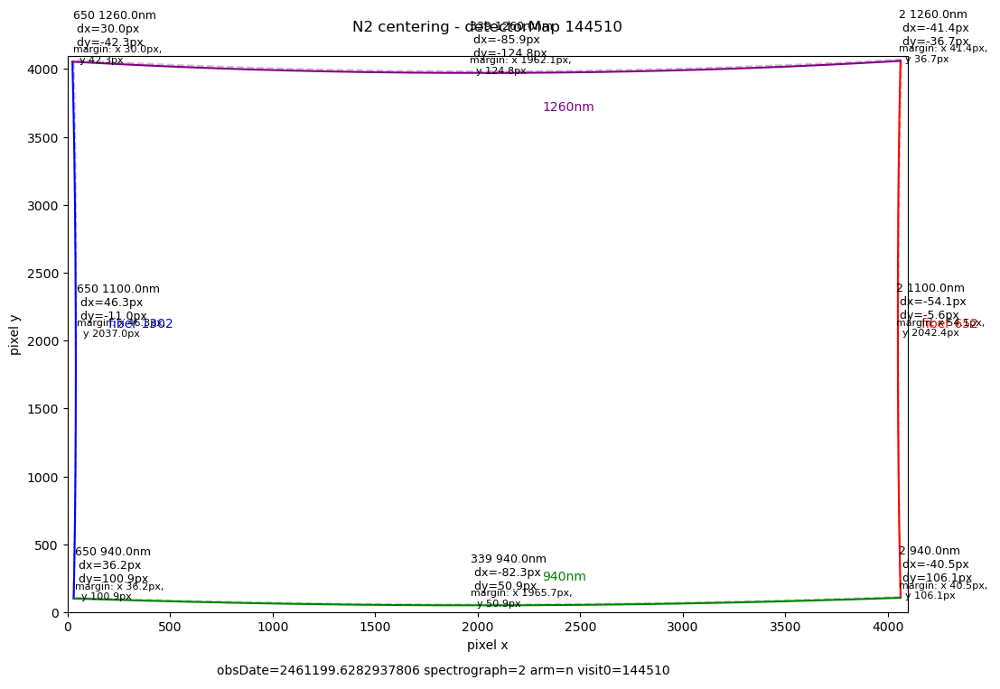

In [37]:
# visit 113382 (initial)
from importlib import reload
#reload(plotReqDetAlignAxe)

fig, ax = plt.subplots(figsize=(12,8))
#fname = os.path.join(imgPath,f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png")
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CU_detMap_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")

out = plotReqDetAlignAxe(detMap, ax=ax, simMap=simMap, doSavePlot=False, fname=fname, waves=waves, specId=specId)

fiber: 1954
fiber: 2604


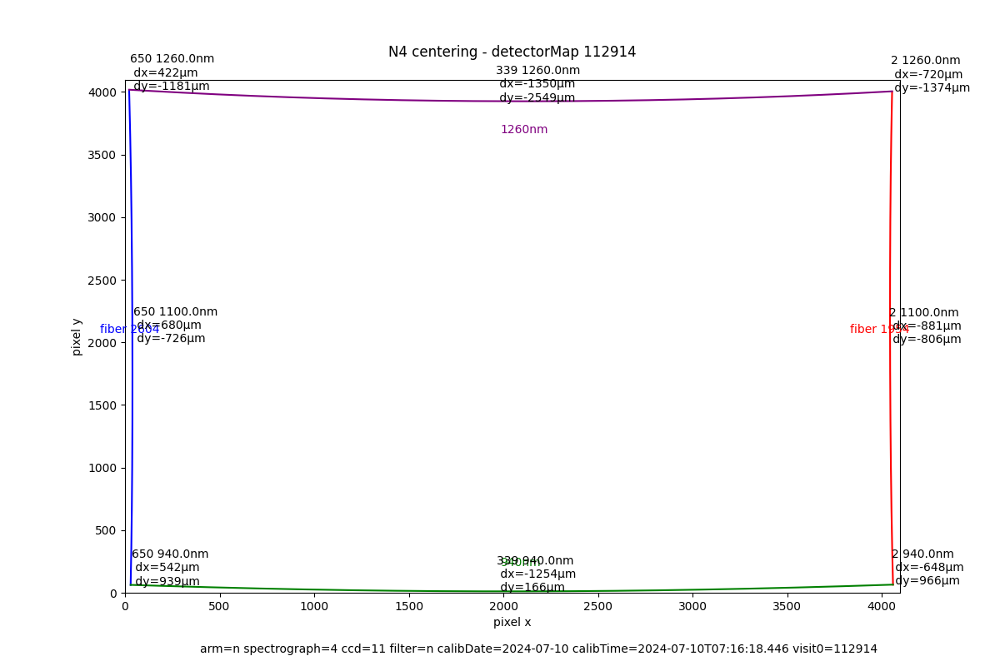

In [70]:
fig, ax = plt.subplots(figsize=(12,8))
#fname = os.path.join(imgPath,f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png")
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CU_detMap_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")

out = plotReqDetAlignAxe(detMap, ax=ax, simMap=None, doSavePlot=False, fname=fname, waves=waves, specId=specId)

# Calculate correction by looking into the spots by eyes

In [ ]:
simMap.getXCenter(2603)

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))
#fname = os.path.join(imgPath,f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png")
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CU_detMap_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)
print(fname)
print(fname)
out = plotDetAlignAxe(detMap, ax=ax, simMap=simMap, doSavePlot=True, fname=fname, fibers=[2,650], specId=specId, waves=[waveLow, waveMid, waveHigh])

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))
#fname = os.path.join(imgPath,f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png")
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CU_detMap_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)
print(fname)
print(fname)
out = plotDetAlignAxe(detMap, ax=ax, simMap=simMap, doSavePlot=True, fname=fname, fibers=[2,650], specId=specId, waves=[waveLow, waveMid, waveHigh])

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))
#fname = os.path.join(imgPath,f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png")
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CU_detMap_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)
print(fname)
print(fname)
out = plotDetAlignAxe(detMap, ax=ax, simMap=simMap, doSavePlot=True, fname=fname, fibers=[2,650], specId=specId, waves=[waveLow, waveMid, waveHigh])

In [103]:
#fig, ax = plt.subplots(figsize=(12,8))
#fname = os.path.join(imgPath,f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png")
fname = os.path.join(imgPath, f"{site}_SM{dataId['spectrograph']}_{dataId['arm'].upper()}{dataId['spectrograph']}_CU_detMap_before_{dataId['visit']}__{datetime.now().strftime('%Y-%m-%dT%Hh%M')}.png")
print(fname)

out = plotDetAlign(detMap, specId=specId, waves=[waveLow, waveMid, waveHigh])

/work/fmadec/analysis/sm1/Subaru_SM1_N1_CU_detMap_before_101767__2023-11-09T11h31.png
24 73
spatial decenter: -49px
spectral decenter: 19px


ValueError: cannot convert float NaN to integer

In [ ]:
detMap.getBBox()

In [95]:
getOffsets(detMap, specId=specId, simMap=simMap, waves=[waveLow, waveMid, waveHigh])

NameError: name 'getOffsets' is not defined

In [ ]:
infos = [
        {"fiber": 2, "color": "red", "annot": (.85,.5)},
        {"fiber": 650, "color": "blue", "annot": (.1,.5)}
        ]

In [ ]:
[item for item in infos if item["fiber"]]

In [ ]:
[d['fiber'] for d in infos if 'fiber' in d]

fiber: 1


ValueError: cannot convert float NaN to integer

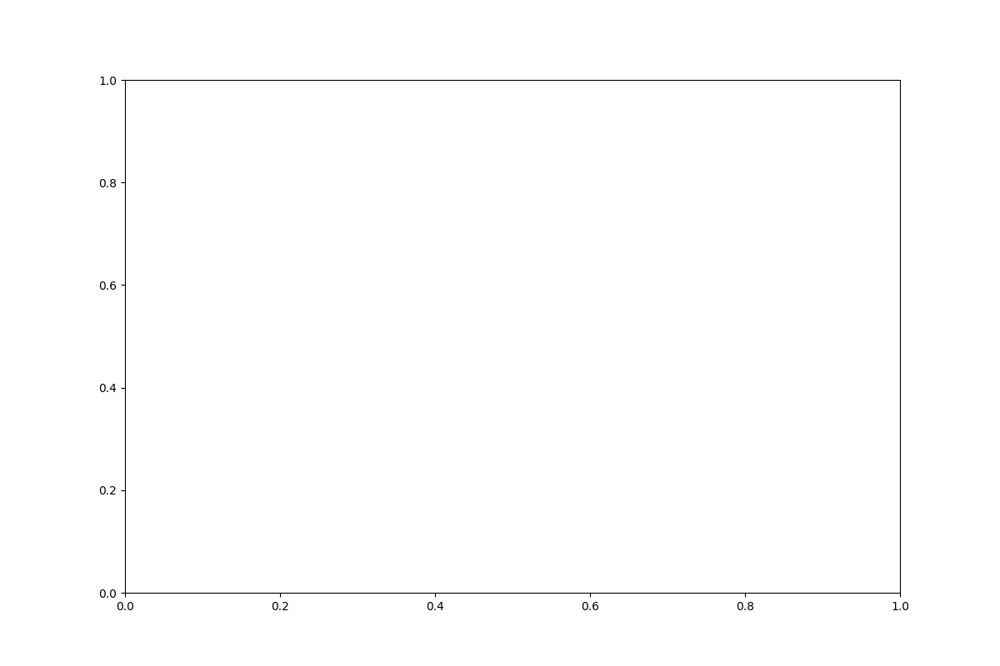

In [115]:
fig, ax = plt.subplots(figsize=(12,8))
plotDetMapContour(detMap, specId=specId, ax=ax, waves=[waveLow, waveMid, waveHigh])

In [ ]:
offsets = getOffsets(detMap, specId=specId, simMap=simMap, waves=[waveLow, waveMid, waveHigh])

In [ ]:
#[item for item in offsets if item["fiber"] == 2]

for offset in offsets:
    print(offset)




In [ ]:
detMap.metadata.toDict()

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))
out = plotDetAlignAxe(detMap, ax=ax, simMap=simMap)

In [ ]:
def plotDetAlignAxe(detMap, specId=2, ax=None, data=True):
    pix_size = 15
    if data is True:
        ls = '-'
        alpha = 1
    else:
        ls = '--'
        alpha = 0.3

    detMapvisitId = 0000
    
    waveMid = waveLow + (waveHigh - waveLow) /2.
    ft = 1 + (specId-1)*651
    xMed_fib2 = int(detMap.findPoint(ft,waveMid).getX()) #ftFunction.yCenter + ftFunction.yLow

    ft = 651 + (specId-1)*651
    xMed_fib650 = int(detMap.findPoint(ft,waveMid).getX()) #ftFunction.yCenter + ftFunction.yLow

    print(naxis1 - xMed_fib2, xMed_fib650)

    # decenter is given by comparing the margin there between the side of the detector and spectrum of the 2 extermes sciences fibers 2 and 650
    # xdim so naxis1 - x of fiber #2 for center wave 
    # 

    spatial_decenter = (naxis1 - xMed_fib2) - xMed_fib650
    print(f"spatial decenter: {spatial_decenter}px")

    ft = 651 + (specId-1)*651
    yHigh_fib339 = int(detMap.findPoint(ft,waveLow).getY())
    yLow_fib339 = int(detMap.findPoint(ft,waveHigh).getY())

    spectral_decenter_ft650 = (naxis2 - yHigh_fib339) - yLow_fib339
    print(f"spectral decenter: {spectral_decenter_ft650}px")

    ft = 1 + (specId-1)*651
    yHigh_fib339 = int(detMap.findPoint(ft,waveLow).getY())
    yLow_fib339 = int(detMap.findPoint(ft,waveHigh).getY())

    spectral_decenter_ft2 = (naxis2 - yHigh_fib339) - yLow_fib339
    print(f"spectral decenter: {spectral_decenter_ft2}px")
    
    ft = 339 + (specId-1)*651
    yHigh_fib339 = int(detMap.findPoint(ft,waveLow).getY())
    yLow_fib339 = int(detMap.findPoint(ft,waveHigh).getY())

    spectral_decenter_ft339 = (naxis2 - yHigh_fib339) - yLow_fib339
    print(f"spectral decenter: {spectral_decenter_ft339}px")

    ft = 2 + (specId-1)*651
    xMid_fib2 = int(detMap.findPoint(2+(specId-1)*651,waveMid).getX())
    yMid_fib650 = int(detMap.findPoint(650+(specId-1)*651,waveMid).getX())
    spectral_decenter_mid = (xMid_fib2 - yMid_fib650 - naxis1)/2
    print(f"spatial Mid decenter: {spectral_decenter_mid}px")

    if ax is None:
        fig, ax = plt.subplots(figsize=(12,8))
    
    ft = 1 + (specId-1)*651
    xCenters = detMap.getXCenter(ft)
    yLow = int(detMap.findPoint(ft,waveLow).getY()) #ftFunction.yCenter + ftFunction.yLow
    yHigh = int(detMap.findPoint(ft,waveHigh).getY())
    print(yLow, yHigh)
    offset = 0
    print(detMap.findWavelength(ft,yLow+offset ))
    ax.plot(xCenters[yLow+offset:yHigh], np.arange(yLow, yHigh), color="red", linestyle=ls, alpha=alpha)
    if data is True:
        ax.annotate(f"fiber {ft}",  xy=(.85,.5),xycoords="figure fraction", color="red")
    #ax2 =ax.twinx()
    xCenters = detMap.getXCenter(ft)
    w = detMap.getWavelength(ft)
    #ax2.plot(xCenters[yLow+offset:yHigh], w[yLow+offset:yHigh], color="red")


    ft = 651 + (specId-1)*651
    xCenters = detMap.getXCenter(ft)
    yLow = int(detMap.findPoint(ft,waveLow).getY()) #ftFunction.yCenter + ftFunction.yLow
    yHigh = int(detMap.findPoint(ft,waveHigh).getY())
    print(yLow, yHigh)
    offset = 0
    print(detMap.findWavelength(ft,yLow+offset ))
    ax.plot(xCenters[yLow+offset:yHigh], np.arange(yLow, yHigh), color="blue", linestyle=ls, alpha=alpha)
    if data is True:
        ax.annotate(f"fiber {ft}",  xy=(.1,.5),xycoords="figure fraction", color="blue")
    xCenters = detMap.getXCenter(ft)
    w = detMap.getWavelength(ft)
    #ax2.plot(xCenters[yLow+offset:yHigh], w[yLow+offset:yHigh], color="blue")

    edgeX = []
    edgeY = []

    for f in detMap.getFiberId():
        edgeX.append(detMap.findPoint(f,waveLow).getX())
        edgeY.append(detMap.findPoint(f,waveLow).getY()) 
    ax.plot(edgeX, edgeY, color="green", linestyle=ls, alpha=alpha)
    if data is True:
        ax.annotate(f"{waveLow}nm",  xy=(.5,.1),xycoords="figure fraction", color="green")

    #ax3 = ax.twiny()
    #ax3.plot(detMap.getFiberId(), edgeY)
    edgeX = []
    edgeY = []

    for f in detMap.getFiberId():
        edgeX.append(detMap.findPoint(f,waveHigh).getX())
        edgeY.append(detMap.findPoint(f,waveHigh).getY()) 
    ax.plot(edgeX, edgeY, color="purple", linestyle=ls, alpha=alpha)
    if data is True:
        ax.annotate(f"{waveHigh}nm",  xy=(.5,.9),xycoords="figure fraction", color="purple")

    edgeX = []
    edgeY = []

    for f in detMap.getFiberId():
        edgeX.append(detMap.findPoint(f,waveMid).getX())
        edgeY.append(detMap.findPoint(f,waveMid).getY()) 
    ax.plot(edgeX, edgeY, color="orange", linestyle=ls, alpha=alpha)
    if data is True:
        ax.annotate(f"{waveMid}nm",  xy=(.5,.45),xycoords="figure fraction", color="orange")

        
    #ax3.plot(detMap.getFiberId(), edgeY)

    ax.set_xlim(1,4095 )
    ax.set_ylim(1,4176 )
    #ax3.set_xlim(detMap.getFiberId()[-1], detMap.getFiberId()[0])
    ax.set_xlabel("pixel x")
    out = ax.set_ylabel("pixel y")
    #ax2.set_ylabel("Wavelength (nm)")
    if data is True:
        plt.annotate(f"Spatial decenter at mid wavelength {waveMid:.1f}nm = {spatial_decenter}px ({spatial_decenter*pix_size:.1f}µm)", (0.3, 0.5), xycoords="figure fraction")
        plt.annotate(f"Spectral decenter at \n(fiber 2, {waveLow:.1f}nm) = {spectral_decenter_ft2}px ({spectral_decenter_ft2*pix_size:.1f}µm)", (0.65, 0.2), xycoords="figure fraction")
        plt.annotate(f"Spectral decenter at \n(fiber 650, {waveLow:.1f}nm) = {spectral_decenter_ft650}px ({spectral_decenter_ft650*pix_size:.1f}µm)", (0.15, 0.2), xycoords="figure fraction")

    plt.title(f"{cam.upper()} centering - detectorMap {detMapvisitId}")
    #plt.savefig(imgPath+f"{cam.upper()}centering-detectorMap{detMapvisitId}"+".png", bbox_inches = "tight")
    return out

In [ ]:
getTiltCUShim(26)

In [ ]:
detMap

In [ ]:
plotDetAlign(detMap)

In [155]:
spatial_decenter = 40

CU horizontal tilt 
Shift 40.00 px
Shift 600.00 microns
angle 0.115 deg
angle 412.529 arsec
shim 1.047 mm


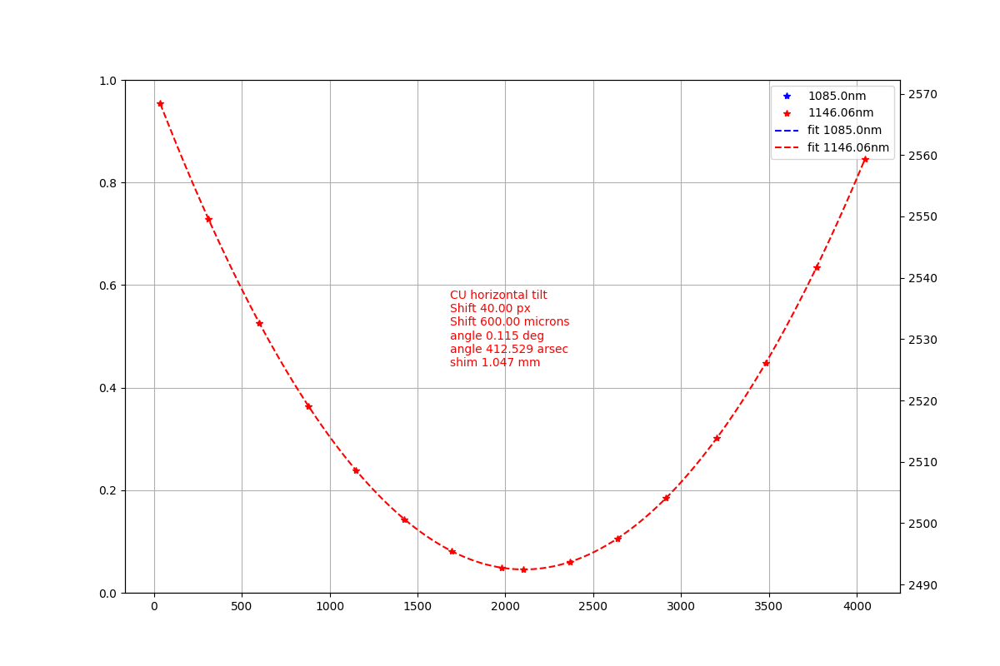

In [156]:
fig, ax = plt.subplots(figsize=(12,8))
plt.grid()
xshift_mm = spatial_decenter*pix_size


annot = "CU horizontal tilt \n"
annot += "Shift %.2f px\n"%spatial_decenter
annot += "Shift %.2f microns\n"%(spatial_decenter*15)
annot += "angle %.3f deg\n"%(math.degrees(math.atan(xshift_mm/F_CU)))
annot += "angle %.3f arsec\n"%(math.degrees(math.atan(xshift_mm/F_CU))*3600)
annot += "shim %.3f mm"%(e*xshift_mm/F_CU)

print(annot)


ax.annotate(annot,  xy=(.45,.45),xycoords="figure fraction", color=color)

    
axy = ax.twinx()
lns2 = axy.plot("x", "y", "*", label=f"{midWaves[1]}nm", data=df[df.wavelength == midWaves[1]], color="r")
data = df[df.wavelength == midWaves[1]]
parab = fitparabola(data.x, data.y)
lns2p = axy.plot("x", "y", "--", label=f"fit {midWaves[1]}nm", data =parab , c="r")
# added these three lines
lns = lns1+lns2+lns1p+lns2p
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

In [ ]:
detMap.findPoint(1301,1260).getX()

In [ ]:
detMap.findWavelength(652, 4095)

In [ ]:
detMap.findWavelength(650 + (specId-1)*651, 4095)

In [ ]:
detMap.getSpectralOffset(652)

In [ ]:
simMap.findWavelength(652, 4095)

In [ ]:
fig = 4; plt.close(fig); fig = plt.figure(fig)

dispDetMap = afwDisplay.Display(fig)

dispDetMap.mtv(exp)
addPfsCursor(dispDetMap, detMap)


In [ ]:
showDetectorMap(dispDetMap, pfsConfig, detMap)

In [ ]:
detMap.getWavelength()

In [ ]:
simMap.getWavelength()

In [106]:
max = 4067
min= 66

In [108]:
print(f"({naxis2} - {max}) - {min}")


(4096 - 4067) - 66


In [109]:
(4096 - 4067) - 66

-37